# Supervised classification for stellar flares

I am using the data prepared by Martino Marelli (email received on March 19, 2024 all_data_final.csv). 

I understand this had a cutoff at CON_NSIGMA > 5, selecting only variable sources (at 5 sigma). Flares are defined as having the FLARE variable = 'Y' (FLARE='-' were treated as no flare). Only the 499 second bin light curves are included.

I split the data into train-test randomly, stratified (forcing an approximately equal fraction of flares in each dataset). I run a two-class supervised classification. I evaluate the performance using the f1 score, the accuracy, and by looking at the pecision-recall curve.

I compare the performance of two models: [gradient boosted trees](https://scikit-learn.org/stable/modules/generated/sklearn.ensemble.GradientBoostingClassifier.html) (gradient boosted trees) and a naive cutoff of the p-value of fitting with a flare model. Additionally, I train a gradient boosted tree model on a subset of the features, excluding the model dependent features.

I use permutation feature importance to find the most important features, use UMAP to visualize our data set in the space of these features, plot ICE curves for each of these features and interpret them.

# Data preparation

In [1]:
import numpy as np
import pandas as pd
from astropy.io import fits
#from imodels import FIGSClassifier, FIGSRegressor, get_clean_dataset, FIGSClassifierCV
from sklearn.model_selection import train_test_split
from sklearn.metrics import confusion_matrix, accuracy_score, f1_score, precision_score, recall_score
from sklearn.model_selection import train_test_split
import matplotlib.pyplot as plt
from sklearn.ensemble import GradientBoostingClassifier as xgb
import seaborn as sns

In [2]:
data_raw = pd.read_csv("all_data_final.csv")
data_raw.columns

Index(['EXTRAS_ID', 'OBS_ID', 'SRC_NUM', 'STAR_FLARE', 'FLARE', 'MULTIFL',
       'DIPECLPER', 'MULTIDEP', 'FIT', 'GOOD_FIT',
       ...
       'FLUX_P40', 'FLUX_P50', 'FLUX_P60', 'FLUX_P67.5', 'FLUX_P75',
       'FLUX_P82.5', 'FLUX_P90', 'FLUX_P95', 'FLUX_0', 'FLUX_1'],
      dtype='object', length=167)

### Reading in the data

In [3]:
data_raw = pd.read_csv("all_data_final.csv")
data_raw['RESCALED_MEDIAN'] = (data_raw['MEDIAN'] - data_raw['FLUX_0'])/(data_raw['FLUX_1'] - data_raw['FLUX_0'])
#max_minus_median = data_raw['FLUX_1'] - data_raw['MEDIAN']
#median_minus_min = data_raw['MEDIAN'] - data_raw['FLUX_0']
#MEDMAXOFF_NOSTRO = (max_minus_median > median_minus_min)*max_minus_median + (max_minus_median <= median_minus_min)*median_minus_min
#data_raw["MEDMAXOFF_PLUS"] = max_minus_median/np.abs(data_raw['MEDIAN'])
#data_raw['MEDMAXOFF_MINUS'] = median_minus_min/np.abs(data_raw['MEDIAN'])

good_variables = ["N_BINS","CON_NSIGMA","LIN_NSIGMA","LIN_CON","LIN_CON_ERR",
                  "LIN_LIN","LIN_LIN_ERR","QU_NSIGMA","QU_CON","QU_CON_ERR","QU_LIN","QU_LIN_ERR",
                  "QU_QU","QU_QU_ERR","DIP1_NSIGMA","DIP1_TMIN","DIP1_TMIN_ERR","DIP1_DT","DIP1_DT_ERR",
                  "DIP1_FLMIN","DIP1_FLMIN_ERR","DIP1_FLMAX","DIP1_FLMAX_ERR","DIP_NSIGMA","DIP_TMIN",
                  "DIP_TMIN_ERR","DIP_DT","DIP_DT_ERR","DIP_FLMIN","DIP_FLMIN_ERR","DIP_FLMAX","DIP_FLMAX_ERR",
                  "DIP_PER","DIP_PER_ERR","EC1_NSIGMA","EC1_TIN","EC1_TIN_ERR","EC1_TFIN","EC1_TFIN_ERR",
                  "EC1_FLMIN","EC1_FLMIN_ERR","EC1_FLMAX","EC1_FLMAX_ERR","EC_NSIGMA","EC_T1","EC_T1_ERR",
                  "EC_T2","EC_T2_ERR","EC_FL1","EC_FL1_ERR","EC_FL2","EC_FL2_ERR","EC_PER","EC_PER_ERR",
                  "FL_NSIGMA","FL_CON","FL_CON_ERR","FL_DFL","FL_DFL_ERR","FL_TMAX","FL_TMAX_ERR","FL_DT",
                  "FL_DT_ERR","FL_RT","FL_RT_ERR","F_NSIGMA_LINCON","F_NSIGMA_QUCON","F_NSIGMA_QULIN",
                  "F_NSIGMA_DIP1CON","F_NSIGMA_DIPCON","F_NSIGMA_DIP1DIP","F_NSIGMA_EC1CON","F_NSIGMA_ECCON",
                  "F_NSIGMA_EC1EC","F_NSIGMA_FLCON","STDEV","SKEW","KURT","AMPLIT","MEDABSDEV",
                  "MEDMAXOFF", 'RESCALED_MEDIAN',
                  "TFRAC_MID20","TFRAC_BEL1S","TFRAC_ABO1S","TFRAC_BEL3S","TFRAC_ABO3S","TFRAC_BEL5S",
                  "TFRAC_ABO5S","TFRAC_BEL1MAD","TFRAC_ABO1MAD","TFRAC_BEL3MAD","TFRAC_ABO3MAD","TFRAC_BEL5MAD",
                  "TFRAC_ABO5MAD", "FLUX_P05","FLUX_P10","FLUX_P17.5","FLUX_P25","FLUX_P32.5",
                  "FLUX_P40","FLUX_P50","FLUX_P60","FLUX_P67.5","FLUX_P75","FLUX_P82.5","FLUX_P90","FLUX_P95"]
good_variables_nomodel = ["N_BINS","CON_NSIGMA","LIN_NSIGMA","LIN_CON","LIN_CON_ERR",
                  "LIN_LIN","LIN_LIN_ERR","QU_NSIGMA","QU_CON","QU_CON_ERR","QU_LIN","QU_LIN_ERR",
                  "QU_QU","QU_QU_ERR","STDEV","SKEW","KURT","AMPLIT","MEDABSDEV", 'RESCALED_MEDIAN',
                  "MEDMAXOFF", "F_NSIGMA_LINCON","F_NSIGMA_QUCON","F_NSIGMA_QULIN",
                  "TFRAC_MID20","TFRAC_BEL1S","TFRAC_ABO1S","TFRAC_BEL3S","TFRAC_ABO3S","TFRAC_BEL5S",
                  "TFRAC_ABO5S","TFRAC_BEL1MAD","TFRAC_ABO1MAD","TFRAC_BEL3MAD","TFRAC_ABO3MAD","TFRAC_BEL5MAD",
                  "TFRAC_ABO5MAD", "FLUX_P05","FLUX_P10","FLUX_P17.5","FLUX_P25","FLUX_P32.5",
                  "FLUX_P40","FLUX_P50","FLUX_P60","FLUX_P67.5","FLUX_P75","FLUX_P82.5","FLUX_P90","FLUX_P95"]
good_variables_ruben = ["N_BINS","CON_NSIGMA","LIN_NSIGMA","LIN_CON","LIN_CON_ERR", 
                  "LIN_LIN","LIN_LIN_ERR","QU_NSIGMA","QU_CON","QU_CON_ERR","QU_LIN","QU_LIN_ERR",
                  "QU_QU","QU_QU_ERR","DIP1_NSIGMA","DIP1_TMIN","DIP1_TMIN_ERR","DIP1_DT","DIP1_DT_ERR",
                  "DIP1_FLMIN","DIP1_FLMIN_ERR","DIP1_FLMAX","DIP1_FLMAX_ERR","DIP_NSIGMA","DIP_TMIN",
                  "DIP_TMIN_ERR","DIP_DT","DIP_DT_ERR","DIP_FLMIN","DIP_FLMIN_ERR","DIP_FLMAX","DIP_FLMAX_ERR",
                  "DIP_PER","DIP_PER_ERR","EC1_NSIGMA","EC1_TIN","EC1_TIN_ERR","EC1_TFIN","EC1_TFIN_ERR",
                  "EC1_FLMIN","EC1_FLMIN_ERR","EC1_FLMAX","EC1_FLMAX_ERR","EC_NSIGMA","EC_T1","EC_T1_ERR",
                  "EC_T2","EC_T2_ERR","EC_FL1","EC_FL1_ERR","EC_FL2","EC_FL2_ERR","EC_PER","EC_PER_ERR",
                  "FL_NSIGMA","FL_CON","FL_CON_ERR","FL_DFL","FL_DFL_ERR","FL_TMAX","FL_TMAX_ERR","FL_DT",
                  "FL_DT_ERR","FL_RT","FL_RT_ERR","F_NSIGMA_LINCON","F_NSIGMA_QUCON","F_NSIGMA_QULIN",
                  "F_NSIGMA_DIP1CON","F_NSIGMA_DIPCON","F_NSIGMA_DIP1DIP","F_NSIGMA_EC1CON","F_NSIGMA_ECCON",
                  "F_NSIGMA_EC1EC","F_NSIGMA_FLCON","STDEV","SKEW","KURT","AMPLIT","MEDABSDEV",
                  "MEDMAXOFF", "RESCALED_MEDIAN",
                  "TFRAC_MID20","TFRAC_BEL1S","TFRAC_ABO1S","TFRAC_BEL3S","TFRAC_ABO3S","TFRAC_BEL5S",
                  "TFRAC_ABO5S","TFRAC_BEL1MAD","TFRAC_ABO1MAD","TFRAC_BEL3MAD","TFRAC_ABO3MAD","TFRAC_BEL5MAD",
                  "TFRAC_ABO5MAD", 'RRANGE_90', 'RFRAC_MID20', 'RFRAC_MID35', 'RFRAC_MID50', 'RFRAC_MID65',
                  'RFRAC_MID80', 'RASYM_20', 'RASYM_35', 'RASYM_50', 'RASYM_65', 'RASYM_80', 'RELRANGE_90']
good_variables_nomodel_ruben = ["N_BINS","CON_NSIGMA","LIN_NSIGMA","LIN_CON","LIN_CON_ERR",
                  "LIN_LIN","LIN_LIN_ERR","QU_NSIGMA","QU_CON","QU_CON_ERR","QU_LIN","QU_LIN_ERR",
                  "QU_QU","QU_QU_ERR","F_NSIGMA_LINCON","F_NSIGMA_QUCON","F_NSIGMA_QULIN","STDEV","SKEW","KURT","AMPLIT","MEDABSDEV",
                  "MEDMAXOFF", "RESCALED_MEDIAN",
                  "TFRAC_MID20","TFRAC_BEL1S","TFRAC_ABO1S","TFRAC_BEL3S","TFRAC_ABO3S","TFRAC_BEL5S",
                  "TFRAC_ABO5S","TFRAC_BEL1MAD","TFRAC_ABO1MAD","TFRAC_BEL3MAD","TFRAC_ABO3MAD","TFRAC_BEL5MAD",
                  "TFRAC_ABO5MAD", 'RRANGE_90', 'RFRAC_MID20', 'RFRAC_MID35', 'RFRAC_MID50', 'RFRAC_MID65',
                  'RFRAC_MID80', 'RASYM_20', 'RASYM_35', 'RASYM_50', 'RASYM_65', 'RASYM_80', 'RELRANGE_90']

X = data_raw[good_variables]
X_nomodel = data_raw[good_variables_nomodel]

y = data_raw['STAR_FLARE'].copy()
z = data_raw['FLARE'].copy()
z[z == '-'] = 'N'
y[y == '-'] = 'N'
y = (y=='Y')
z = (z=='Y') & (~y)

ID = (data_raw['EXTRAS_ID'])

filter_m1000 = ~(X == -1000).any(axis=1)
X_filtered = X[filter_m1000]
X_nomodel_filtered = X_nomodel[filter_m1000]
y_filtered = y[filter_m1000]
z_filtered = z[filter_m1000]
ID_filtered = ID[filter_m1000]

print(X.shape)
print(X_filtered.shape)

print(X_nomodel.shape)
print(X_nomodel_filtered.shape)

print(data_raw.shape)

U = X_filtered.copy()
U["EXTRAS_ID"] = ID_filtered
U["NONSTAR_FLARE"] = z_filtered
U.to_csv("U.csv")

(13855, 108)
(13851, 108)
(13855, 50)
(13851, 50)
(13855, 168)


In [4]:
#pd.DataFrame({name=X.columns, })
#X.describe().to_latex()
[c for c in X_filtered.columns]

['N_BINS',
 'CON_NSIGMA',
 'LIN_NSIGMA',
 'LIN_CON',
 'LIN_CON_ERR',
 'LIN_LIN',
 'LIN_LIN_ERR',
 'QU_NSIGMA',
 'QU_CON',
 'QU_CON_ERR',
 'QU_LIN',
 'QU_LIN_ERR',
 'QU_QU',
 'QU_QU_ERR',
 'DIP1_NSIGMA',
 'DIP1_TMIN',
 'DIP1_TMIN_ERR',
 'DIP1_DT',
 'DIP1_DT_ERR',
 'DIP1_FLMIN',
 'DIP1_FLMIN_ERR',
 'DIP1_FLMAX',
 'DIP1_FLMAX_ERR',
 'DIP_NSIGMA',
 'DIP_TMIN',
 'DIP_TMIN_ERR',
 'DIP_DT',
 'DIP_DT_ERR',
 'DIP_FLMIN',
 'DIP_FLMIN_ERR',
 'DIP_FLMAX',
 'DIP_FLMAX_ERR',
 'DIP_PER',
 'DIP_PER_ERR',
 'EC1_NSIGMA',
 'EC1_TIN',
 'EC1_TIN_ERR',
 'EC1_TFIN',
 'EC1_TFIN_ERR',
 'EC1_FLMIN',
 'EC1_FLMIN_ERR',
 'EC1_FLMAX',
 'EC1_FLMAX_ERR',
 'EC_NSIGMA',
 'EC_T1',
 'EC_T1_ERR',
 'EC_T2',
 'EC_T2_ERR',
 'EC_FL1',
 'EC_FL1_ERR',
 'EC_FL2',
 'EC_FL2_ERR',
 'EC_PER',
 'EC_PER_ERR',
 'FL_NSIGMA',
 'FL_CON',
 'FL_CON_ERR',
 'FL_DFL',
 'FL_DFL_ERR',
 'FL_TMAX',
 'FL_TMAX_ERR',
 'FL_DT',
 'FL_DT_ERR',
 'FL_RT',
 'FL_RT_ERR',
 'F_NSIGMA_LINCON',
 'F_NSIGMA_QUCON',
 'F_NSIGMA_QULIN',
 'F_NSIGMA_DIP1CON',
 'F_NSIG

In [5]:
[c for c in data_raw.columns]

['EXTRAS_ID',
 'OBS_ID',
 'SRC_NUM',
 'STAR_FLARE',
 'FLARE',
 'MULTIFL',
 'DIPECLPER',
 'MULTIDEP',
 'FIT',
 'GOOD_FIT',
 '3XMM',
 '4XMM',
 'PPS',
 'TSTART_LC',
 'TSTOP_LC',
 'N_BINS',
 'AVERAGE',
 'AVERAGE_ERR',
 'CON_NHP',
 'CON_NSIGMA',
 'CON_CON',
 'CON_CON_ERR',
 'LIN_NHP',
 'LIN_NSIGMA',
 'LIN_CON',
 'LIN_CON_ERR',
 'LIN_LIN',
 'LIN_LIN_ERR',
 'QU_NHP',
 'QU_NSIGMA',
 'QU_CON',
 'QU_CON_ERR',
 'QU_LIN',
 'QU_LIN_ERR',
 'QU_QU',
 'QU_QU_ERR',
 'DIP1_NSIGMA',
 'DIP1_TMIN',
 'DIP1_TMIN_ERR',
 'DIP1_DT',
 'DIP1_DT_ERR',
 'DIP1_FLMIN',
 'DIP1_FLMIN_ERR',
 'DIP1_FLMAX',
 'DIP1_FLMAX_ERR',
 'DIP_NHP',
 'DIP_NSIGMA',
 'DIP_TMIN',
 'DIP_TMIN_ERR',
 'DIP_DT',
 'DIP_DT_ERR',
 'DIP_FLMIN',
 'DIP_FLMIN_ERR',
 'DIP_FLMAX',
 'DIP_FLMAX_ERR',
 'DIP_PER',
 'DIP_PER_ERR',
 'EC1_NHP',
 'EC1_NSIGMA',
 'EC1_TIN',
 'EC1_TIN_ERR',
 'EC1_TFIN',
 'EC1_TFIN_ERR',
 'EC1_FLMIN',
 'EC1_FLMIN_ERR',
 'EC1_FLMAX',
 'EC1_FLMAX_ERR',
 'EC_NHP',
 'EC_NSIGMA',
 'EC_T1',
 'EC_T1_ERR',
 'EC_T2',
 'EC_T2_ERR',
 'EC_F

Preparing the final dataset for train-test splitting. I am turning 'FLARE' into a binary variable and selecting only certain columns (from 24 to 144, see to what this corresponds in terms of variable names by looking above). I then split the dataset into train-test. The split is stratified given how unbalanced the data set is.

In [6]:
X_train, X_test, y_train, y_test, id_train, id_test, z_train, z_test = train_test_split(X_filtered, y_filtered,
                            ID_filtered, z_filtered, test_size=0.2, random_state=888, stratify=y_filtered)
X_train_nomodel, X_test_nomodel, y_train_nomodel, y_test_nomodel, id_train, id_test = train_test_split(X_nomodel_filtered, y_filtered, ID_filtered,
                                             test_size=0.2, random_state=888, stratify=y_filtered)

In [7]:
train_data_for_Gaia = X_train.copy()
train_data_for_Gaia["y"] =  y_train
train_data_for_Gaia.to_csv("train.csv")

test_data_for_Gaia = X_test.copy()
test_data_for_Gaia["y"] =  y_test
test_data_for_Gaia.to_csv("test.csv")

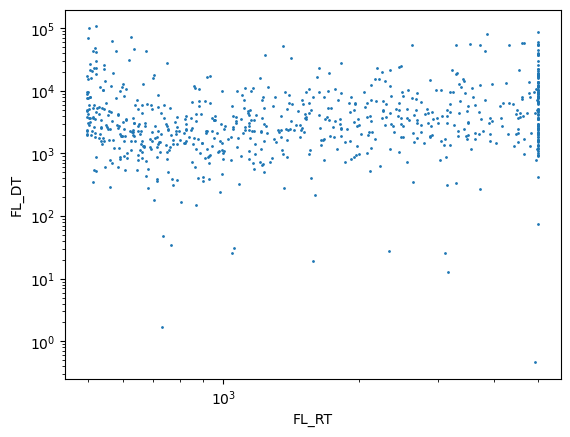

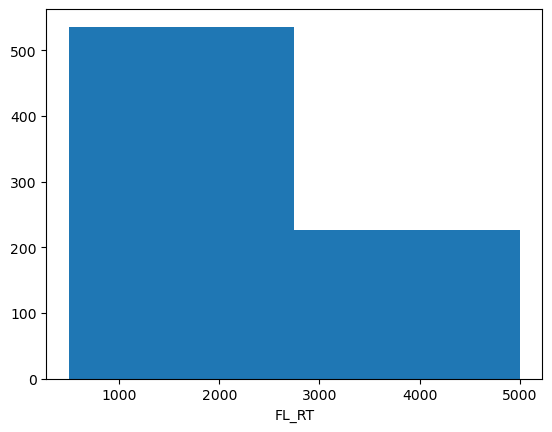

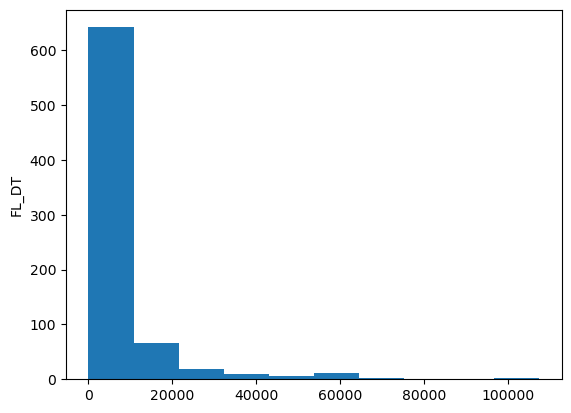

['EXTRAS_ID',
 'OBS_ID',
 'SRC_NUM',
 'STAR_FLARE',
 'FLARE',
 'MULTIFL',
 'DIPECLPER',
 'MULTIDEP',
 'FIT',
 'GOOD_FIT',
 '3XMM',
 '4XMM',
 'PPS',
 'TSTART_LC',
 'TSTOP_LC',
 'N_BINS',
 'AVERAGE',
 'AVERAGE_ERR',
 'CON_NHP',
 'CON_NSIGMA',
 'CON_CON',
 'CON_CON_ERR',
 'LIN_NHP',
 'LIN_NSIGMA',
 'LIN_CON',
 'LIN_CON_ERR',
 'LIN_LIN',
 'LIN_LIN_ERR',
 'QU_NHP',
 'QU_NSIGMA',
 'QU_CON',
 'QU_CON_ERR',
 'QU_LIN',
 'QU_LIN_ERR',
 'QU_QU',
 'QU_QU_ERR',
 'DIP1_NSIGMA',
 'DIP1_TMIN',
 'DIP1_TMIN_ERR',
 'DIP1_DT',
 'DIP1_DT_ERR',
 'DIP1_FLMIN',
 'DIP1_FLMIN_ERR',
 'DIP1_FLMAX',
 'DIP1_FLMAX_ERR',
 'DIP_NHP',
 'DIP_NSIGMA',
 'DIP_TMIN',
 'DIP_TMIN_ERR',
 'DIP_DT',
 'DIP_DT_ERR',
 'DIP_FLMIN',
 'DIP_FLMIN_ERR',
 'DIP_FLMAX',
 'DIP_FLMAX_ERR',
 'DIP_PER',
 'DIP_PER_ERR',
 'EC1_NHP',
 'EC1_NSIGMA',
 'EC1_TIN',
 'EC1_TIN_ERR',
 'EC1_TFIN',
 'EC1_TFIN_ERR',
 'EC1_FLMIN',
 'EC1_FLMIN_ERR',
 'EC1_FLMAX',
 'EC1_FLMAX_ERR',
 'EC_NHP',
 'EC_NSIGMA',
 'EC_T1',
 'EC_T1_ERR',
 'EC_T2',
 'EC_T2_ERR',
 'EC_F

In [8]:
plt.scatter(X_train["FL_RT"][y_train], X_train["FL_DT"][y_train], s = 1)
plt.xlabel("FL_RT")
plt.ylabel("FL_DT")
plt.xscale('log')
plt.yscale('log')
plt.show()

plt.hist(X_train["FL_RT"][y_train], bins = 2)
plt.xlabel("FL_RT")
plt.show()

plt.hist(X_train["FL_DT"][y_train])
plt.ylabel("FL_DT")
plt.show()


[c for c in data_raw.columns]

# Training XGBoost

Now let us fit an XGBoost model to the training data and evaluate its predictions on the test data. Note that I am not optimizing the model's hyperparameters.

In [9]:
model_xgb = xgb(n_estimators=1000, random_state=888)
model_xgb_nomodel = xgb(n_estimators=1000, random_state=888)  

model_xgb.fit(X_train, y_train)  
preds_xgb = model_xgb.predict(X_test)

model_xgb_nomodel.fit(X_train_nomodel, y_train_nomodel)  
preds_xgb_nomodel = model_xgb_nomodel.predict(X_test_nomodel)

In [10]:
from sklearn.metrics import precision_recall_curve as prc
preds_proba_xgb = model_xgb.predict_proba(X_test)
precision_recall_xgboost = prc(y_test, preds_proba_xgb[:,1])

preds_proba_xgb_nomodel = model_xgb_nomodel.predict_proba(X_test_nomodel)
precision_recall_xgboost_nomodel = prc(y_test_nomodel, preds_proba_xgb_nomodel[:,1])

In [11]:
preds_xgb_tr = model_xgb.predict(X_train)
preds_proba_xgb_tr = model_xgb.predict_proba(X_train)


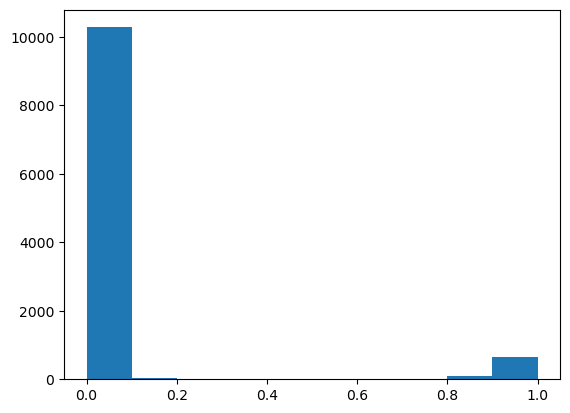

In [12]:
plt.hist(preds_proba_xgb_tr[:,1])
plt.show()

In [16]:
confusion_matrix(np.concatenate([y_train, y_test]), np.concatenate([preds_proba_xgb_tr[:,1] > 0.5, preds_proba_xgb[:,1] > 0.5])) #preds_proba_xgb[:,1] > 0.5


array([[12868,    30],
       [   50,   903]])

In [13]:
np.sqrt(np.sum(y_test))/len(y_test)
#np.sum(preds_proba_xgb[:,1] > 0.5)/len(y_test)

0.004987468408908428

In [14]:
false_positives = ((preds_xgb == 1) & (y_test == 0))
false_negatives = ((preds_xgb == 0) & (y_test == 1))
id_test[false_positives].to_csv('false_positives.csv')
id_test[false_negatives].to_csv('false_negatives.csv')

## Writing down FP and FN for Martino

Mi servirebbe la lista di tutte le sorgenti (possibilmente in fits) che contenga:
- extras_id, observation_id, source_number
- fa parte del nostro test sample? Y/N (in modo anche da avere dentro i falsi/veri positivi/negativi)
- se fa parte del nostro sample, noi l'abbiamo vista come flare? (è possibile anche la colonna flare singolo o doppio?)
- l'algoritmo la vede come flare? (mettendo la soglia che decidi tu)
- qual'è la probabilità di essere flare?

# Scoring the model

In [15]:
accuracy_xgb = accuracy_score(y_test, preds_xgb)
accuracy_xgb

0.9711295561169253

In [16]:
accuracy_xgb_nomodel = accuracy_score(y_test_nomodel, preds_xgb_nomodel)
accuracy_xgb_nomodel

0.9498376037531577

The accuracy score is deceivingly high. The dataset is very unbalanced, so predicting always no flare would yield an accuracy of:

In [17]:
sum(1-y_test)/len(y_test)
#1-sum(1-y_train)/len(y_train)
#np.sum(preds_xgb)/len(preds_xgb)

0.9310718152291592

Clearly we need a better metric for evaluating the classifier. Here is the raw confusion matrix:

In [18]:
confusion_matrix(y_test, preds_xgb)

array([[2550,   30],
       [  50,  141]])

In [19]:
confusion_matrix(y_test_nomodel, preds_xgb_nomodel)

array([[2539,   41],
       [  98,   93]])

In [20]:
from sklearn.metrics import precision_recall_curve

The precision score (aka purity in astro catalogs) measures what fraction of actual flares was found among the sources tagged as flares. It is pretty decent:

In [21]:
precision_xgb = precision_score(y_test, preds_xgb)
precision_xgb

0.8245614035087719

In [22]:
precision_xgb_nomodel = precision_score(y_test_nomodel, preds_xgb_nomodel)
precision_xgb_nomodel

0.6940298507462687

On the other hand the recall score (completeness for astronomers I guess) is not so good:

In [23]:
recall_xgb = recall_score(y_test, preds_xgb)
recall_xgb

0.7382198952879581

In [24]:
recall_xgb_nomodel = recall_score(y_test_nomodel, preds_xgb_nomodel)
recall_xgb_nomodel

0.4869109947643979

The recall score is the fraction of actual flares we correctly tag as flares. We miss one in four.

The F1 score summarizes both recall and precision by taking their harmonic mean. Here it is:

In [25]:
f1_xgb = f1_score(y_test, preds_xgb)
f1_xgb

0.7790055248618785

In [26]:
f1_xgb_nomodel = f1_score(y_test_nomodel, preds_xgb_nomodel)
f1_xgb_nomodel

0.5723076923076923

# Post-hoc explainability on XGBoost

### Permutation feature importance

In [27]:
from sklearn.inspection import permutation_importance
r = permutation_importance(model_xgb, X_test, y_test, n_repeats=50, random_state=888)

In [28]:
r_nomodel = permutation_importance(model_xgb_nomodel, X_test_nomodel, y_test_nomodel, n_repeats=10, random_state=888)

In [29]:
for i in r.importances_mean.argsort()[::-1]:
    if r.importances_mean[i] - r.importances_std[i] > 0: #stuff that is useful at the 2-sigma level
         print(f"{X_train.columns[i]:<8} "
               f"{r.importances_mean[i]:.5f} "
               f" +/- {r.importances_std[i]:.5f}")

F_NSIGMA_FLCON 0.05885  +/- 0.00369
FL_NSIGMA 0.01007  +/- 0.00183
FL_DT_ERR 0.00903  +/- 0.00165
MEDMAXOFF 0.00519  +/- 0.00162
TFRAC_BEL1S 0.00048  +/- 0.00035
TFRAC_ABO1S 0.00041  +/- 0.00030
EC_PER_ERR 0.00035  +/- 0.00032


In [30]:
for i in r_nomodel.importances_mean.argsort()[::-1]:
    if r_nomodel.importances_mean[i] - 2*r_nomodel.importances_std[i] > 0:
         print(f"{X_train_nomodel.columns[i]:<8} "
               f"{r_nomodel.importances_mean[i]:.3f} "
               f" +/- {r_nomodel.importances_std[i]:.3f}")

MEDMAXOFF 0.016  +/- 0.001
LIN_NSIGMA 0.006  +/- 0.001
FLUX_P75 0.005  +/- 0.002
RESCALED_MEDIAN 0.004  +/- 0.001
FLUX_P67.5 0.004  +/- 0.001
N_BINS   0.003  +/- 0.001
TFRAC_ABO1S 0.003  +/- 0.001
TFRAC_ABO5S 0.002  +/- 0.001
FLUX_P60 0.002  +/- 0.001
TFRAC_ABO5MAD 0.002  +/- 0.001
FLUX_P40 0.001  +/- 0.000
TFRAC_ABO1MAD 0.001  +/- 0.000


## Shapley values for individual data-points

In [35]:
#EXPLAIN THE ONE INSTANCE BY SACCHI

from IPython.display import display, HTML
import shap
shap.initjs()

explainer = shap.Explainer(model_xgb)

idsexplain = ['0764460501_005_499',] #['0744412201_001_499', '0842550101_013_499', '0824610201_002_499', '0803050501_001_499', '0673490101_001_499', '0675040101_001_499', '0820860101_001_499']
for idx in idsexplain:
    Xexplain = X_train[id_train == idx]
    data_point = Xexplain
    print(f"Source ID: {idsexplain[0]}")   
    shap_values = explainer.shap_values(data_point)
    shap_html = shap.force_plot(explainer.expected_value, shap_values, data_point, show=False)
    display(HTML(shap_html.html())) 

Source ID: 0764460501_005_499


In [25]:
#THE ORIGINAL CELL
from IPython.display import display, HTML
import shap
shap.initjs()

explainer = shap.Explainer(model_xgb)

idsfp = id_test[false_positives]
idsfn = id_test[false_negatives]
X_testfp = X_test[false_positives]
X_testfn = X_test[false_negatives]
ppfp = (preds_proba_xgb[false_positives])[:,1]
ppfn = (preds_proba_xgb[false_negatives])[:,0]

posi = X_testfp.copy()
posi["idsfp"] = idsfp
posi["ppfp"] = ppfp
nega = X_testfn.copy()
nega["idsfn"] = idsfn
nega["ppfn"] = ppfn

#SORT THEM
posi = posi.sort_values(by='ppfp', ascending=False)
nega = nega.sort_values(by='ppfn', ascending=False)


print("***********************************************************")
print("*FALSE POSITIVES (XGBoost says FLARE, human says NO FLARE)*")
print("***********************************************************")
for i in range(posi.shape[0]):
    data_point = posi.drop(["idsfp", "ppfp"], axis=1).iloc[i]
    print(f"Source ID: {posi['idsfp'].iloc[i]}")
    print(f"Confidence: {np.round(posi['ppfp'].iloc[i],2)}")    
    shap_values = explainer.shap_values(data_point)
    shap_html = shap.force_plot(explainer.expected_value, shap_values, data_point, show=False)
    display(HTML(shap_html.html())) 

print("***********************************************************")
print("*FALSE NEGATIVES (XGBoost says NO FLARE, human says FLARE)*")
print("***********************************************************")
for i in range(nega.shape[0]):
    data_point = nega.drop(["idsfn", "ppfn"], axis=1).iloc[i]
    print(f"Source ID: {nega['idsfn'].iloc[i]}")
    print(f"Confidence: {np.round(nega['ppfn'].iloc[i],2)}")
    shap_values = explainer.shap_values(data_point)
    shap_html = shap.force_plot(explainer.expected_value, shap_values, data_point, show=False)
    display(HTML(shap_html.html())) 

***********************************************************
*FALSE POSITIVES (XGBoost says FLARE, human says NO FLARE)*
***********************************************************
Source ID: 0840210401_013_499
Confidence: 1.0


Source ID: 0720581001_006_499
Confidence: 1.0


Source ID: 0722360301_005_499
Confidence: 1.0


Source ID: 0845030201_032_499
Confidence: 1.0


Source ID: 0761920101_005_499
Confidence: 0.99


Source ID: 0801400301_001_499
Confidence: 0.99


Source ID: 0782840801_001_499
Confidence: 0.98


Source ID: 0840840201_001_499
Confidence: 0.98


Source ID: 0677850931_001_499
Confidence: 0.98


Source ID: 0764850201_002_499
Confidence: 0.96


Source ID: 0861910301_001_499
Confidence: 0.95


Source ID: 0841190101_028_499
Confidence: 0.94


Source ID: 0760900101_012_499
Confidence: 0.9


Source ID: 0692080201_007_499
Confidence: 0.87


Source ID: 0694610101_003_499
Confidence: 0.86


Source ID: 0695200301_012_499
Confidence: 0.81


Source ID: 0765080801_001_499
Confidence: 0.81


Source ID: 0728960632_006_499
Confidence: 0.81


Source ID: 0822740401_001_499
Confidence: 0.7


Source ID: 0720173901_002_499
Confidence: 0.63


Source ID: 0804300901_002_499
Confidence: 0.62


Source ID: 0510391001_012_499
Confidence: 0.61


Source ID: 0677681234_013_499
Confidence: 0.6


Source ID: 0691670201_001_499
Confidence: 0.59


Source ID: 0679810401_001_499
Confidence: 0.59


Source ID: 0844350101_001_499
Confidence: 0.55


Source ID: 0844640101_001_499
Confidence: 0.54


Source ID: 0743840201_004_499
Confidence: 0.53


Source ID: 0830191501_020_499
Confidence: 0.53


Source ID: 0864840301_001_499
Confidence: 0.52


***********************************************************
*FALSE NEGATIVES (XGBoost says NO FLARE, human says FLARE)*
***********************************************************
Source ID: 0728560301_004_499
Confidence: 1.0


Source ID: 0822200101_006_499
Confidence: 1.0


Source ID: 0761090201_001_499
Confidence: 1.0


Source ID: 0841320101_002_499
Confidence: 1.0


Source ID: 0728560201_003_499
Confidence: 1.0


Source ID: 0763720401_002_499
Confidence: 0.99


Source ID: 0694770101_002_499
Confidence: 0.99


Source ID: 0724820101_007_499
Confidence: 0.99


Source ID: 0761920801_008_499
Confidence: 0.99


Source ID: 0827050501_003_499
Confidence: 0.98


Source ID: 0844430201_011_499
Confidence: 0.98


Source ID: 0791980501_001_499
Confidence: 0.98


Source ID: 0840210101_008_499
Confidence: 0.98


Source ID: 0801310101_002_499
Confidence: 0.98


Source ID: 0841710101_015_499
Confidence: 0.97


Source ID: 0844000901_005_499
Confidence: 0.97


Source ID: 0840211101_002_499
Confidence: 0.97


Source ID: 0741890501_001_499
Confidence: 0.97


Source ID: 0761920801_005_499
Confidence: 0.96


Source ID: 0782430101_001_499
Confidence: 0.95


Source ID: 0802290201_001_499
Confidence: 0.94


Source ID: 0860200101_001_499
Confidence: 0.94


Source ID: 0782400101_004_499
Confidence: 0.92


Source ID: 0724560101_007_499
Confidence: 0.92


Source ID: 0761090301_001_499
Confidence: 0.91


Source ID: 0671960101_001_499
Confidence: 0.9


Source ID: 0770180101_014_499
Confidence: 0.89


Source ID: 0720890201_001_499
Confidence: 0.88


Source ID: 0822210101_003_499
Confidence: 0.88


Source ID: 0841480701_005_499
Confidence: 0.87


Source ID: 0800030801_020_499
Confidence: 0.86


Source ID: 0782490601_002_499
Confidence: 0.85


Source ID: 0761920601_002_499
Confidence: 0.78


Source ID: 0720700201_001_499
Confidence: 0.78


Source ID: 0761550201_001_499
Confidence: 0.75


Source ID: 0783340601_001_499
Confidence: 0.75


Source ID: 0800050101_001_499
Confidence: 0.75


Source ID: 0802580401_001_499
Confidence: 0.74


Source ID: 0761090201_005_499
Confidence: 0.74


Source ID: 0677670132_005_499
Confidence: 0.68


Source ID: 0762750201_003_499
Confidence: 0.66


Source ID: 0782430101_006_499
Confidence: 0.6


Source ID: 0800030901_005_499
Confidence: 0.6


Source ID: 0745120101_004_499
Confidence: 0.57


Source ID: 0821870201_001_499
Confidence: 0.57


Source ID: 0743070101_004_499
Confidence: 0.56


Source ID: 0802830501_001_499
Confidence: 0.55


Source ID: 0762440201_008_499
Confidence: 0.54


Source ID: 0671960101_006_499
Confidence: 0.51


Source ID: 0800031001_027_499
Confidence: 0.5


In [32]:
from IPython.display import display, HTML
import shap

explainer = shap.Explainer(model_xgb_nomodel)

false_positives_nomodel = ((preds_xgb_nomodel == 1) & (y_test == 0))
false_negatives_nomodel = ((preds_xgb_nomodel == 0) & (y_test == 1))

idsfp = id_test[false_positives_nomodel]
idsfn = id_test[false_negatives_nomodel]
X_testfp = X_test[false_positives_nomodel]
X_testfn = X_test[false_negatives_nomodel]
ppfp = (preds_proba_xgb_nomodel[false_positives_nomodel])[:,1]
ppfn = (preds_proba_xgb_nomodel[false_negatives_nomodel])[:,0]

posi = X_testfp.copy()
posi["idsfp"] = idsfp
posi["ppfp"] = ppfp
nega = X_testfn.copy()
nega["idsfn"] = idsfn
nega["ppfn"] = ppfn

#SORT THEM
posi = posi.sort_values(by='ppfp', ascending=False)
nega = nega.sort_values(by='ppfn', ascending=False)


print("***********************************************************")
print("*FALSE POSITIVES (XGBoost says FLARE, human says NO FLARE)*")
print("***********************************************************")
for i in range(posi.shape[0]):
    data_point = posi.drop(["idsfp", "ppfp"], axis=1).iloc[i]
    print(posi['idsfp'].iloc[i])
    print(posi['ppfp'].iloc[i])    
    shap_values = explainer.shap_values(data_point)
    shap_html = shap.force_plot(explainer.expected_value, shap_values, data_point, show=False)
    display(HTML(shap_html.html())) 

print("***********************************************************")
print("*FALSE NEGATIVES (XGBoost says NO FLARE, human says FLARE)*")
print("***********************************************************")
for i in range(nega.shape[0]):
    data_point = nega.drop(["idsfn", "ppfn"], axis=1).iloc[i]
    print(nega['idsfn'].iloc[i])
    print(nega['ppfn'].iloc[i])
    shap_values = explainer.shap_values(data_point)
    shap_html = shap.force_plot(explainer.expected_value, shap_values, data_point, show=False)
    display(HTML(shap_html.html())) 

***********************************************************
*FALSE POSITIVES (XGBoost says FLARE, human says NO FLARE)*
***********************************************************
0801931901_002_499
0.9901040240301459


0764850201_002_499
0.9842799865395644


0743840201_004_499
0.9830920217558338


0861910301_001_499
0.9829412106061245


0677850931_001_499
0.941311290220337


0801400301_001_499
0.9340302901521158


0872390101_001_499
0.9167995802506731


0761120401_001_499
0.9136926691562114


0693300101_001_499
0.9089708238960682


0860370201_001_499
0.8941128105754661


0782840801_001_499
0.8904343559276539


0724770701_005_499
0.885209095761736


0761920101_005_499
0.8730469416746557


0782840601_005_499
0.8711971385600557


0827060701_006_499
0.8614863840013828


0761690301_295_499
0.8609629885437303


0827311201_003_499
0.8461954571946495


0841190101_028_499
0.8236538512145686


0794581201_005_499
0.8133401398765159


0845030201_032_499
0.804140380361779


0722360301_005_499
0.8008293593860021


0720581001_006_499
0.7869721216022593


0770190501_002_499
0.784521750914022


0840840201_001_499
0.7792521718727247


0727960401_008_499
0.7760511172953433


0743610101_054_499
0.7579911260872702


0822350201_006_499
0.7526634609811144


0801100101_001_499
0.6949443695502513


0803030501_006_499
0.687213771403041


0823990501_001_499
0.6459310269756161


0743610101_033_499
0.6428070356387093


0841660401_002_499
0.6220298334250217


0510391001_014_499
0.6195311111833571


0800971501_001_499
0.6098111099234848


0679810401_001_499
0.6035842953191667


0841481101_017_499
0.5851281117380235


0690200501_003_499
0.5671365694345921


0760900101_012_499
0.5641687495103964


0840230501_001_499
0.5393016628053737


0740140501_015_499
0.517485833072735


0790590201_001_499
0.5102814419648559


***********************************************************
*FALSE NEGATIVES (XGBoost says NO FLARE, human says FLARE)*
***********************************************************
0822200101_006_499
0.9996291052418727


0841710101_015_499
0.9992291703552515


0802290201_001_499
0.9987140445181029


0791980501_001_499
0.9986099395530568


0844000901_005_499
0.9984996452616841


0729560501_031_499
0.9982021735702147


0724820101_007_499
0.9975909796981248


0840211101_002_499
0.9973371562221852


0802830501_001_499
0.9958085864944424


0823591801_003_499
0.9957499302920142


0690750801_025_499
0.9956436019099393


0841320101_002_499
0.9944556029651951


0795712601_016_499
0.9937860019664844


0761920801_008_499
0.9936942734690275


0694770101_002_499
0.9927324135495826


0844430201_011_499
0.9925410301422057


0720540501_273_499
0.9923591880261254


0671960101_001_499
0.992355629498725


0844020101_002_499
0.9920307124253053


0723130401_011_499
0.9910253670985897


0782400101_004_499
0.9908430250072605


0762750201_003_499
0.988918715822916


0763720401_002_499
0.9885484787526875


0761090201_001_499
0.9873876650556184


0761920801_001_499
0.9831589552724967


0782430101_006_499
0.9826441114950806


0827050501_003_499
0.9824117771597566


0692934001_013_499
0.9812714376139025


0841480701_005_499
0.9809371242010441


0745120101_004_499
0.9807816175018623


0760330101_007_499
0.9802443510049094


0692934301_034_499
0.9795742786495655


0692050101_007_499
0.9713036738074871


0741890501_001_499
0.9698342075554012


0800760701_003_499
0.9687286677676643


0840210101_008_499
0.9660657677516511


0761090301_007_499
0.9576364726360738


0761920801_005_499
0.9488883749138569


0690200701_001_499
0.9484468604797381


0720700201_001_499
0.9410882703592037


0728560201_003_499
0.9365725996467822


0674050101_003_499
0.9362323865583873


0740640101_011_499
0.9320093871813934


0770180101_014_499
0.926227157963069


0740040301_011_499
0.9236692926820416


0762520201_013_499
0.9224165112175499


0761560701_004_499
0.9214963322298135


0800030801_020_499
0.9153827523640043


0802580401_001_499
0.9126985158446889


0801682801_021_499
0.9105481985639083


0763850101_004_499
0.9085198774130333


0821870201_001_499
0.9068351451699187


0728560301_004_499
0.8848573884791594


0724560101_007_499
0.8760600207419704


0743840101_009_499
0.8688303684313237


0722330201_014_499
0.8674513180771816


0782430101_001_499
0.8651884978461777


0724190601_008_499
0.8604852588079115


0800031001_010_499
0.8590654728223586


0827050801_002_499
0.8462655868563407


0801680501_004_499
0.8285046704754507


0790381401_013_499
0.8249216183175728


0693221501_002_499
0.8211176187236171


0800030901_006_499
0.8079380356303474


0720890201_001_499
0.807260274344163


0762860101_001_499
0.8047322996352798


0761090301_001_499
0.8043020322514348


0694641501_011_499
0.8007771123497626


0862470901_019_499
0.7971123131206981


0827351301_002_499
0.787963389331535


0801310101_002_499
0.7876009750537055


0841190101_005_499
0.7836518103491719


0720173601_001_499
0.7803348837352595


0727960301_004_499
0.7366769283998778


0762980101_002_499
0.7366439319410425


0827031501_006_499
0.7164570853523463


0822040401_003_499
0.7146022003016523


0729560501_003_499
0.708248735288797


0720173501_002_499
0.7055959588496303


0720700301_012_499
0.6948302849659388


0761921201_005_499
0.6899681521967919


0861170701_004_499
0.6899218660287547


0823031601_003_499
0.6859263610338507


0692330401_001_499
0.6741885611383281


0852980201_004_499
0.6684916066251494


0677670132_005_499
0.6608075962373167


0761090201_005_499
0.6574309232754166


0783080101_021_499
0.648760327628527


0729560501_004_499
0.6439429686512759


0761910201_007_499
0.5971658905004564


0652280201_022_499
0.5734685406749782


0693990201_006_499
0.5694697556215722


0723410501_048_499
0.5585628913174698


0822390601_002_499
0.5565424762197821


0744980601_001_499
0.5539612546750926


0782490601_002_499
0.5291334618729513


0783160101_007_499
0.5197404586206442


0761920601_002_499
0.5163377123797244


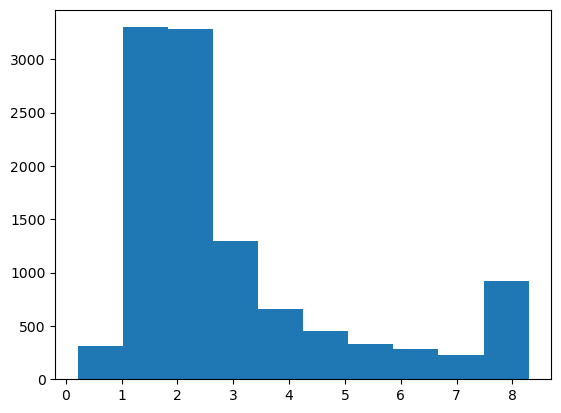

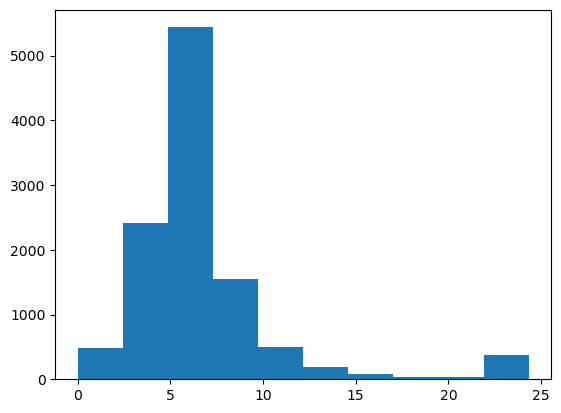

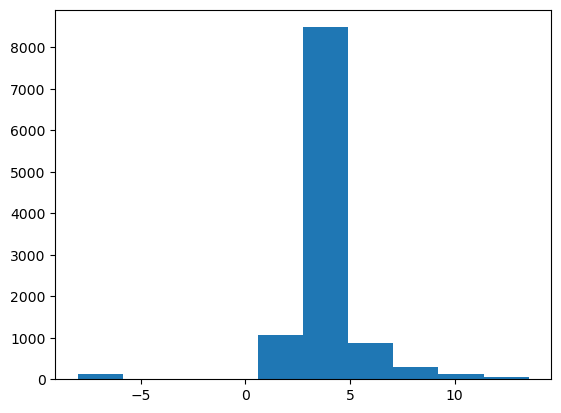

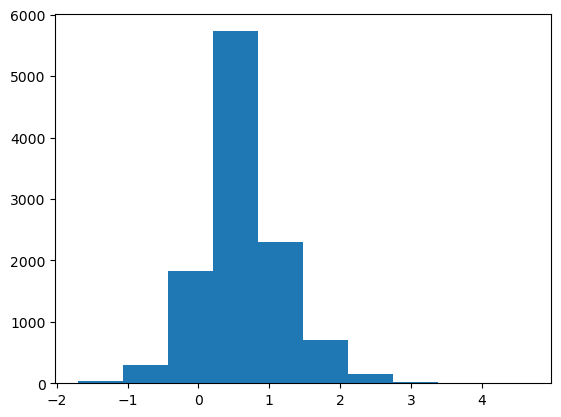

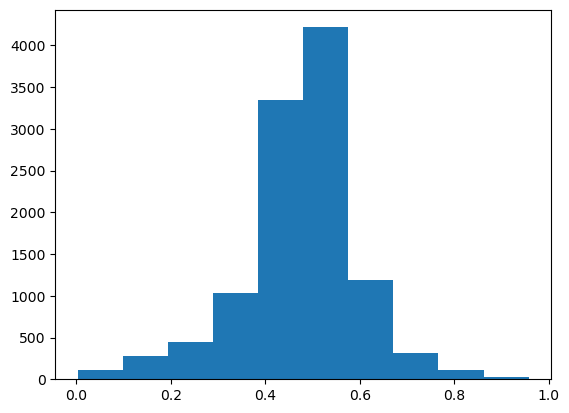

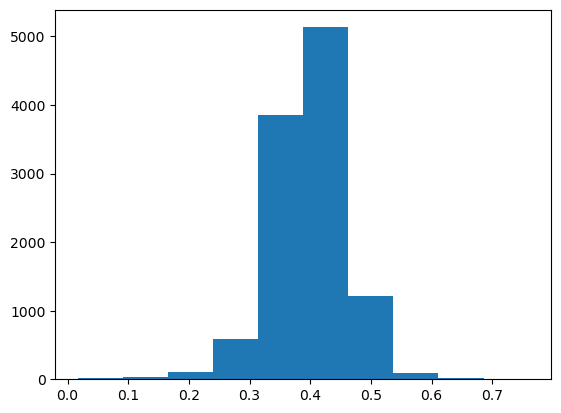

In [31]:
impofi = ['F_NSIGMA_FLCON','FL_NSIGMA','FL_DT_ERR','MEDMAXOFF','FLUX_P50', 'TFRAC_BEL1S']  
X_train_for_UMAP = X_train[impofi].copy()
X_train_for_UMAP["MEDMAXOFF"] = np.log10(1E-8 + X_train_for_UMAP["MEDMAXOFF"])
X_train_for_UMAP["FL_DT_ERR"] = np.log10(1E-8 + X_train_for_UMAP["FL_DT_ERR"])
#X_train_for_UMAP["EC_PER_ERR"] = np.log10(1E-8 + X_train_for_UMAP["EC_PER_ERR"])

X_test_for_UMAP = X_test[impofi].copy()
X_test_for_UMAP["MEDMAXOFF"] = np.log10(1E-8 + X_test_for_UMAP["MEDMAXOFF"])
X_test_for_UMAP["FL_DT_ERR"] = np.log10(1E-8 + X_test_for_UMAP["FL_DT_ERR"])
#X_test_for_UMAP["EC_PER_ERR"] = np.log10(1E-8 + X_test_for_UMAP["EC_PER_ERR"])


for fe in impofi:
    plt.hist(X_train_for_UMAP[fe])
    plt.show()

/opt/anaconda3/lib/python3.12/site-packages/umap/umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(


False    11035
True        45
Name: count, dtype: int64
col_0  False  True 
row_0              
False  10945     90
True      45      0
Amici di 0701981201_002_499
12411    0827050301_035_499
2322     0701981201_002_499
313      0672060101_048_499
139      0657600301_186_499
13322    0862470701_006_499
Name: EXTRAS_ID, dtype: object
Amici di 0782961001_003_499
633     0677760140_007_499
7512    0782961001_003_499
5442    0760646701_010_499
Name: EXTRAS_ID, dtype: object
Amici di 0780451401_029_499
7034    0780451401_029_499
6115    0762290201_013_499
7497    0782840501_003_499
Name: EXTRAS_ID, dtype: object


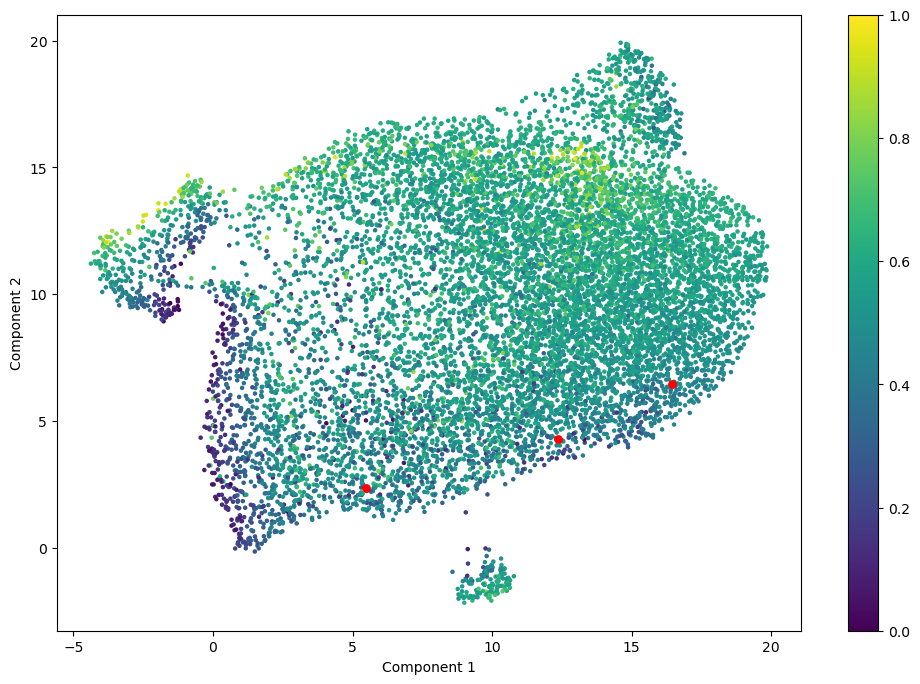

In [45]:
import umap
from sklearn.preprocessing import RobustScaler
import matplotlib.pyplot as plt

# Initialize the RobustScaler
scaler = RobustScaler(quantile_range = (0.1, 0.9))

# Fit and transform X_train
X_train_scaled = scaler.fit_transform(X_train_for_UMAP[impofi])

# Initialize UMAP
reducer = umap.UMAP(n_components=2, n_neighbors=100, min_dist=1, random_state=888)

# Fit and transform the scaled data
embedding = reducer.fit_transform(X_train_scaled)

# 'FLUX_P05',
# 'FLUX_P10',
# 'FLUX_P17.5',
# 'FLUX_P25',
# 'FLUX_P32.5',
# 'FLUX_P40',
# 'FLUX_P50',
# 'FLUX_P60',
# 'FLUX_P67.5',
# 'FLUX_P75',
# 'FLUX_P82.5',
# 'FLUX_P90',
# 'FLUX_P95',

little_tree = (X_train['TFRAC_ABO1S'] > 0.4451814) & (X_train['FL_TMAX_ERR'] <= 111.0484) & (X_train['FL_TMAX'] <= 9727.45)
#TFRAC_ABO1S > 0.4451814: FALSE (13594/88)
#TFRAC_ABO1S <= 0.4451814:
#:...FL_TMAX_ERR > 111.0484: FALSE (221/9)
#    FL_TMAX_ERR <= 111.0484:
#    :...FL_TMAX <= 9727.45: TRUE (15/3)
#        FL_TMAX > 9727.45: FALSE (21/1)

# embedding is now a 2-dimensional representation of your scaled data
plt.figure(figsize=(12, 8))
bad_flare_fit_bad_constant_fit = little_tree #(X_train['CON_NSIGMA'] > 24) #np.log10(X_train['F_NSIGMA_FLCON']) #& (X_train['FL_NSIGMA'] > 24) # 
print(bad_flare_fit_bad_constant_fit.value_counts())
plt.scatter(embedding[:, 0], embedding[:, 1], s=5, c=X_train['FLUX_P60']) #np.log10(X_train['LIN_CON'])
#plt.scatter(embedding[id_train == '0744412201_001_499', 0], embedding[id_train == '0744412201_001_499', 1], s=15, color = "#BB1212")
#plt.scatter(embedding[angolino, 0], embedding[angolino, 1], s=5, c = "#C40000")
#plt.scatter(embedding[ffff, 0], embedding[ffff, 1], s=9, c = "#00FF00")

martini = ['0701981201_002_499','0782961001_003_499','0780451401_029_499'] #flares brevi

rubenno = ['0764460501_005_499',]

rubenni = ["0823680101_001_499","0831790701_001_499","0851180401_001_499","0913990201_001_499","0914792701_001_499",
          "0914793101_001_499","0110890201_001_499","0157560101_001_499","0506200201_001_499","0554710801_001_499",
          "0606320401_001_499","0606322001_001_499","0741280201_001_499","0744412201_001_499","0763480101_001_499",
          "0792180301_001_499","0861910201_001_499","0883770401_001_499","0871190301_001_499","0851180501_001_499"]

sak = ["0411980401_001_499", "0851180401_001_499", "0864560101_001_499", "0861910301_001_499", "0872390101_001_499",
"0883770101_005_499", "0883770401_001_499", "0954190401_001_499", "0871190301_001_499"]

sak_on = ['0823680101_001_499', '0831790701_001_499', '0851180401_001_499', '0864330101_001_499', '0913990201_001_499']
sak_off = ['0657820101_001_499','0740960101_001_499','0864330201_001_499','0864330301_001_499','0864330401_001_499','0884970101_001_499','0884970201_001_499']

amicisak = ['0764800801_001_499','0764850201_001_499' ,'0824450901_027_499' ,'0800030801_001_499' ,'0800580101_024_499' ,'0861600101_004_499' ,'0790380801_003_499' ,
'0690441801_006_499' ,'0720890101_005_499' ,'0741450101_001_499' ,'0770980101_001_499' ,'0743850101_004_499' ,'0770180601_001_499',
'0690600401_004_499' ,'0671960101_005_499' ,'0781350101_010_499' ,'0827360501_004_499' ,'0864810101_010_499' ,'0822530101_005_499',
'0781040101_003_499']

print(pd.crosstab(little_tree, z_train))

#plt.scatter(embedding[z_train, 0], embedding[z_train, 1], s=14, c = "#FF0000")

amici_delle_foglie = ["0823990501_001_499", "0844630101_001_499", "0830191101_001_499", "0823991001_001_499",
                        "0853000101_001_499", "0671850601_001_499", "0694070101_001_499", "0830551101_001_499",
                        "0865040601_001_499", "0761120301_001_499", "0864840301_002_499", "0723310201_001_499",
                     "0824610201_002_499", "0761720101_001_499", "0822210101_001_499", "0823780601_001_499",
                     "0761690301_001_499", "0783880101_001_499", "0780561501_001_499", "0741800301_001_499"]

x_br = 15
y_br = 4
condi = ((embedding[:, 0] - x_br)*(embedding[:, 0] - x_br) + (embedding[:, 1] - y_br)*(embedding[:, 1] - y_br) ) < 0.2
bottomright = id_train[condi & (X_train['FLUX_P60'] < 0.3)]

x_ru = embedding[id_train == '0764460501_005_499', 0]
y_ru = embedding[id_train == '0764460501_005_499', 1]
vicini_di_rubenno = id_train[((embedding[:, 0] - x_ru)*(embedding[:, 0] - x_ru) + (embedding[:, 1] - y_ru)*(embedding[:, 1] - y_ru) )< 0.2]

#for amico in sak_on:
#    plt.scatter(embedding[id_train == amico, 0], embedding[id_train == amico, 1], s=15, color = "#DA0000")

#for amico in sak_off:
#    plt.scatter(embedding[id_train == amico, 0], embedding[id_train == amico, 1], s=15, color = "#FF0000")

#for amico in amicisak:
#    plt.scatter(embedding[id_train == amico, 0], embedding[id_train == amico, 1], s=15, color = "#05CC00")   

#for amico in rubenno:
#    plt.scatter(embedding[id_train == amico, 0], embedding[id_train == amico, 1], s=88, color = "#000000")

#for amico in vicini_di_rubenno:
#    plt.scatter(embedding[id_train == amico, 0], embedding[id_train == amico, 1], s=8, color = "#797979")

#for amico in bottomright:
#    plt.scatter(embedding[id_train == amico, 0], embedding[id_train == amico, 1], s=8, color = "#A0A0A0")

for m in martini:
    plt.scatter(embedding[id_train == m, 0], embedding[id_train == m, 1], s=28, color = "#FF0000")
    Xm = embedding[id_train == m, 0]
    Ym = embedding[id_train == m, 1]
    print("Amici di " + m)
    amici = (embedding[:,0] - Xm)*(embedding[:,0] - Xm) + (embedding[:,1] - Ym)*(embedding[:,1] - Ym) < 0.025  
    print(id_train[amici])

#plt.title('UMAP Projection of X_train (Scaled with RobustScaler)')
plt.xlabel('Component 1')
plt.ylabel('Component 2')
plt.colorbar()
plt.show()

/opt/anaconda3/lib/python3.12/site-packages/pandas/core/arraylike.py:399: RuntimeWarning: divide by zero encountered in log10
  result = getattr(ufunc, method)(*inputs, **kwargs)


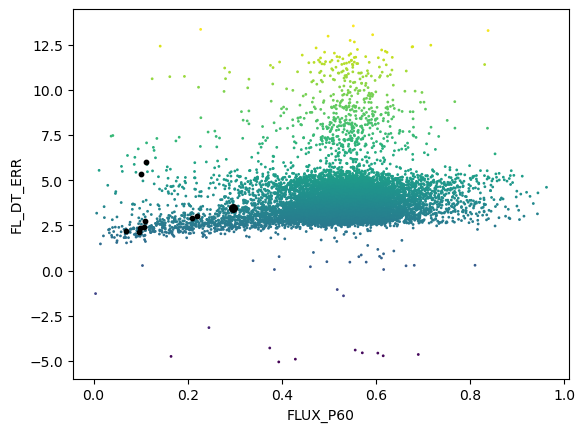

In [57]:
plt.scatter(X_train["FLUX_P60"], np.log10(X_train['FL_DT_ERR']), s= 1, c=np.log10(X_train['FL_DT_ERR']))
plt.xlabel("FLUX_P60")
plt.ylabel("FL_DT_ERR")

for amico in rubenno:
    plt.scatter(X_train["FLUX_P60"][id_train == amico], np.log10(X_train["FL_DT_ERR"][id_train == amico]), s=30, color = "#000000")

for amico in rubenni:
    plt.scatter(X_train["FLUX_P60"][id_train == amico], np.log10(X_train["FL_DT_ERR"][id_train == amico]), s=10, color = "#000000")

plt.show()

In [143]:
ffff = (X_train['FLUX_P60'] < 0.25) & (X_train['FL_NSIGMA'] > 24) & (X_train['F_NSIGMA_FLCON'] > 5) #flares col fit a flare fallito
print(id_train[ffff])
lui = (id_train == '0744412201_001_499')
print(X_train['FLUX_P60'][lui])

12625    0840380201_022_499
10714    0823680101_001_499
10615    0823480201_001_499
12205    0851180501_001_499
3983     0740590101_001_499
7112     0780760401_001_499
13834    0872390901_002_499
10092    0820860101_001_499
5475     0760900101_004_499
7906     0785110201_001_499
5094     0744600101_001_499
11500    0830450101_007_499
8452     0800031001_001_499
2230     0695060101_001_499
567      0675040101_001_499
11561    0830530401_001_499
13619    0864560101_001_499
5836     0761690301_001_499
12197    0851180401_001_499
13749    0870920101_001_499
13217    0861910201_001_499
5145     0745060401_001_499
9258     0803620501_001_499
1943     0693900101_001_499
13413    0862730101_002_499
8834     0801880501_001_499
1994     0694070101_001_499
11600    0831790701_001_499
13800    0871190701_001_499
12928    0844101101_001_499
10768    0823990601_001_499
7197     0781500101_001_499
4090     0741280201_001_499
12741    0841481101_001_499
6408     0763480101_001_499
4973     0744412201_

In [104]:
from sklearn.linear_model import Lasso
from sklearn.preprocessing import StandardScaler
from sklearn.pipeline import make_pipeline
from sklearn.metrics import r2_score, mean_squared_error
import numpy as np

# Build mask on the DataFrame
angolino = (X_train['F_NSIGMA_FLCON'] > 8) & (X_train['FL_NSIGMA'] > 24)

# Target variable on the same subset
y = embedding[angolino, 0]

alpha = 0.1  # larger => sparser

lasso_pipe = make_pipeline(
    # If X is dense DataFrame, you can use with_mean=True; keep False if X can be sparse
    StandardScaler(with_mean=False),
    Lasso(alpha=alpha, max_iter=10000)  # random_state only matters if selection='random'
)

# >>> Use .loc for pandas DataFrame subset <<<
X_sub = X_train.loc[angolino, :]

lasso_pipe.fit(X_sub, y)

lasso = lasso_pipe.named_steps["lasso"]
coef = lasso.coef_
intercept = lasso.intercept_
nnz = int(np.count_nonzero(coef))

print(f"Alpha: {alpha}")
print(f"Nonzero coefficients: {nnz} / {coef.size}")
print(f"Intercept: {intercept:.6g}")

# Predict/evaluate on the SAME subset you trained on (or use a proper holdout)
y_hat = lasso_pipe.predict(X_sub)
print(f"Train R²: {r2_score(y, y_hat):.4f}")
print(f"Train RMSE: {mean_squared_error(y, y_hat, squared=False):.6f}")

# Feature names
try:
    feature_names = X_train.columns
except AttributeError:
    feature_names = np.array([f"x{i}" for i in range(coef.size)])

selected = [(name, w) for name, w in zip(feature_names, coef) if w != 0]
selected = sorted(selected, key=lambda t: abs(t[1]), reverse=True)

print("\nTop selected features:")
for name, w in selected[:20]:
    print(f"{name:>25s}  {w:+.6g}")


Alpha: 0.1
Nonzero coefficients: 8 / 108
Intercept: -2.06846
Train R²: 0.8464
Train RMSE: 0.331115

Top selected features:
                 FLUX_P60  -0.435078
            TFRAC_ABO3MAD  +0.132251
          F_NSIGMA_DIPCON  -0.0549424
            TFRAC_ABO1MAD  +0.0412253
                 FLUX_P75  -0.0369597
               FLUX_P67.5  -0.0324599
                    FL_DT  -0.0223479
                 FLUX_P50  -0.00280933


/opt/anaconda3/lib/python3.12/site-packages/sklearn/metrics/_regression.py:492: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.
  warnings.warn(


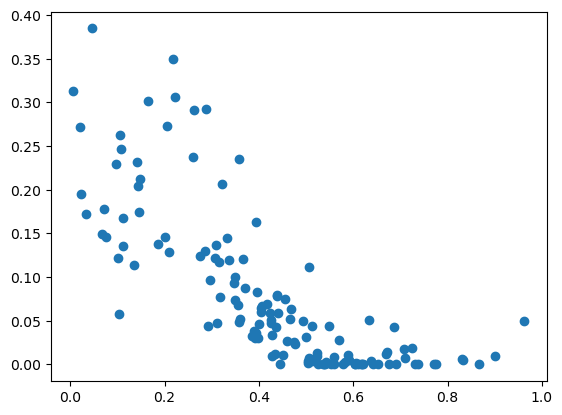

In [94]:
plt.scatter(X_train['FLUX_P60'][angolino], X_train['TFRAC_ABO3MAD'][angolino])
plt.show()

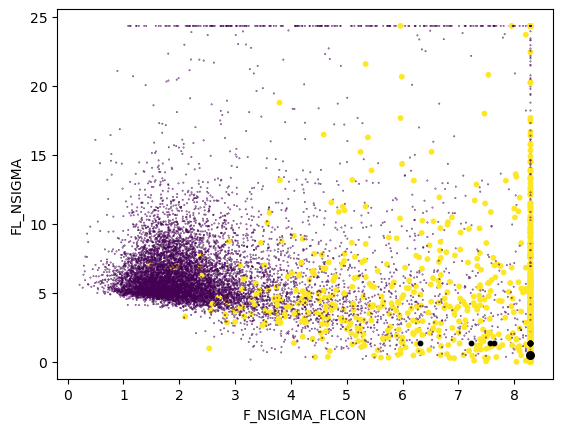

In [51]:
plt.scatter((X_train['F_NSIGMA_FLCON']), (X_train['FL_NSIGMA']), c=y_train, s = 0.1 + 10*y_train)
plt.xlabel(('F_NSIGMA_FLCON'))
plt.ylabel(('FL_NSIGMA'))
pd.crosstab(X_train['F_NSIGMA_FLCON'] > 8, X_train['FL_NSIGMA'] > 24)

for amico in rubenno:
    plt.scatter(X_train["F_NSIGMA_FLCON"][id_train == amico], np.log10(X_train["FL_NSIGMA"][id_train == amico]), s=30, color = "#000000")

for amico in rubenni:
    plt.scatter(X_train["F_NSIGMA_FLCON"][id_train == amico], np.log10(X_train["FL_NSIGMA"][id_train == amico]), s=10, color = "#000000")

plt.show()

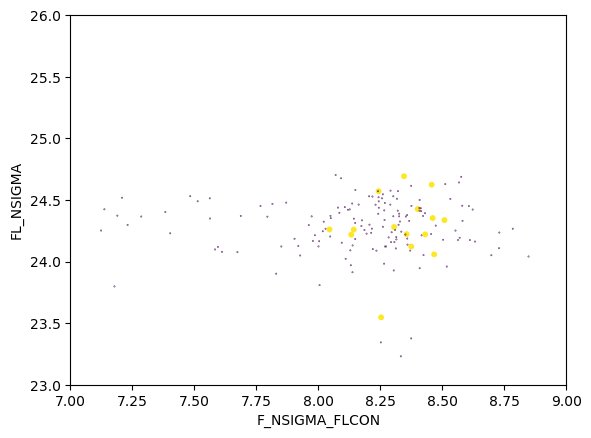

In [80]:
plt.scatter((X_train['F_NSIGMA_FLCON']) + 0.2*np.random.normal(size=len(y_train)), (X_train['FL_NSIGMA']) + 0.2*np.random.normal(size=len(y_train)), c=y_train, s = 0.1 + 10*y_train)
plt.xlabel(('F_NSIGMA_FLCON'))
plt.ylabel(('FL_NSIGMA'))
plt.ylim([23, 26])
plt.xlim([7.0, 9.0])
plt.show()

angolino = (X_train['F_NSIGMA_FLCON'] > 8) & (X_train['FL_NSIGMA'] > 24)

In [42]:
data_raw['EXTRAS_ID'] %in% id_train

0        0411780701_001_499
1        0411782101_001_499
2        0412580801_001_499
3        0412601401_004_499
4        0412601401_006_499
                ...        
13850    0872990301_007_499
13851    0872990401_001_499
13852    0872990401_003_499
13853    0872990401_004_499
13854    0872990401_006_499
Name: EXTRAS_ID, Length: 13855, dtype: object

In [63]:
import numpy as np
import pandas as pd

target_id = '0744412201_001_499'

# Prendi i valori "nudi" degli id per costruire la mask
id_vals = id_train.values if isinstance(id_train, pd.Series) else np.asarray(id_train)

# Trova la riga dell'ID target
idx_target = np.flatnonzero(id_vals == target_id)
if len(idx_target) == 0:
    raise ValueError(f"ID {target_id} non trovato in id_train")
if len(idx_target) > 1:
    # se ci sono duplicati, prendi la prima occorrenza (o gestiscili come preferisci)
    idx_target = idx_target[:1]

# Coordinate del punto di riferimento nell'embedding
x_explain, y_explain = embedding[idx_target[0], 0], embedding[idx_target[0], 1]

# Distanze euclidee
u = embedding[:, 0] - x_explain
v = embedding[:, 1] - y_explain
rho = np.sqrt(u*u + v*v)

# Indici assoluti dei vicini entro il raggio
idx_filtered = np.flatnonzero(rho < 0.3)

# Ordina per distanza (sempre su indici posizionali)
order = np.argsort(rho[idx_filtered])
idx_sorted = idx_filtered[order]

# --- Stampa risultati in modo compatibile pandas/NumPy ---

# ID corrispondenti
if isinstance(id_train, pd.Series):
    print(id_train.iloc[idx_sorted].to_numpy())
else:
    print(np.asarray(id_train)[idx_sorted])

# Righe di X_train corrispondenti, ordinate per distanza
if isinstance(X_train, pd.DataFrame):
    print(X_train.iloc[idx_sorted])
else:
    print(np.asarray(X_train)[idx_sorted])


['0744412201_001_499' '0842550101_013_499' '0824610201_002_499'
 '0803050501_001_499' '0673490101_001_499' '0675040101_001_499'
 '0820860101_001_499']
       N_BINS  CON_NSIGMA  LIN_NSIGMA       LIN_CON   LIN_CON_ERR  \
4973       73   24.327637   24.327637  7.441599e-13  1.599210e-13   
12850     234   24.327637    8.793349  1.769923e-13  9.879814e-15   
11002     233   24.327637   24.327637  3.264787e-12  1.573383e-13   
9152      249   24.327637   24.327637  7.146889e-14  4.960698e-15   
388       177   24.327637   24.327637  2.821354e-13  1.711439e-14   
567        84   24.327637   24.327637  3.588304e-12  5.163120e-13   
10092     144   24.327637   24.327637  5.634469e-14  1.871957e-14   

            LIN_LIN   LIN_LIN_ERR  QU_NSIGMA        QU_CON    QU_CON_ERR  ...  \
4973   3.300264e-18  7.617069e-18  24.327637  2.150531e-12  1.854274e-13  ...   
12850  5.070211e-18  1.718210e-19   8.827215  1.731649e-13  1.503121e-14  ...   
11002 -1.565196e-17  2.240523e-18  24.327637  4.04454

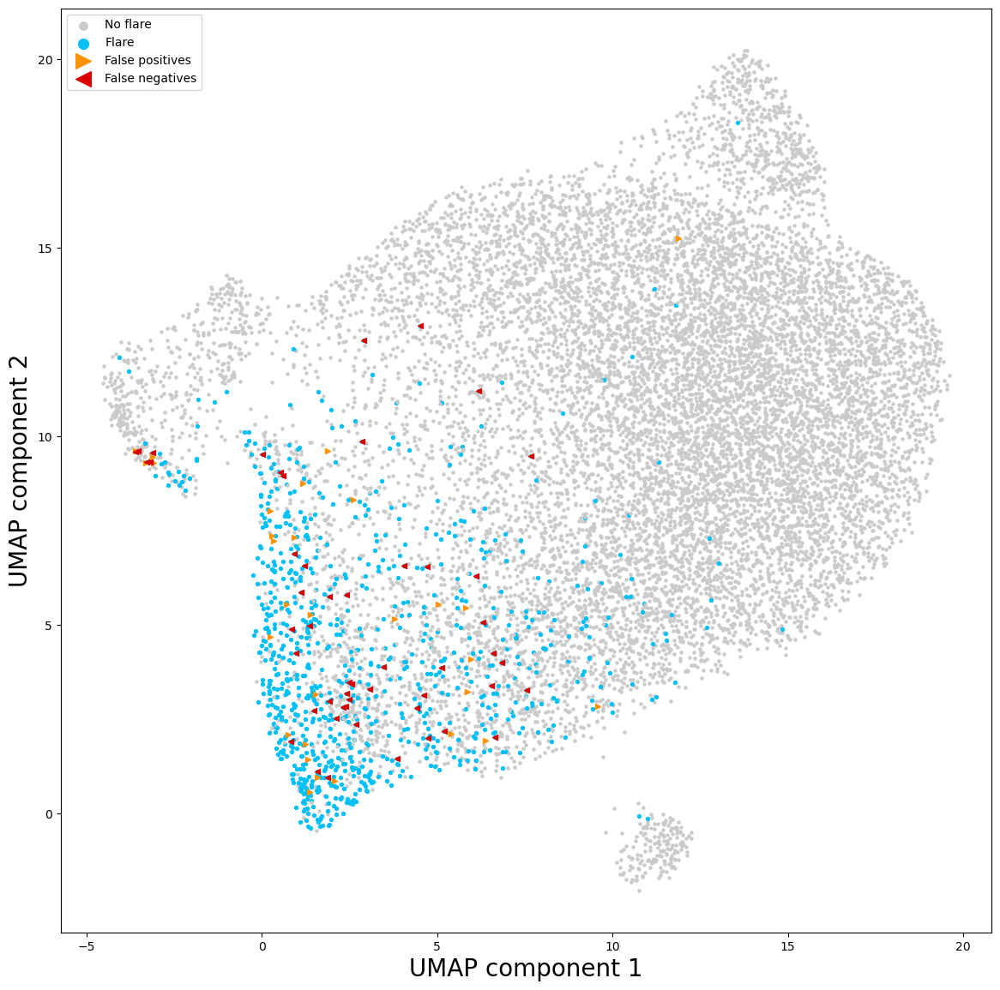

In [110]:
X_test_scaled = scaler.fit_transform(X_test_for_UMAP)
X_test_embedding = reducer.transform(X_test_scaled)

plt.figure(figsize=(14, 14))
plt.scatter(embedding[~y_train, 0], embedding[~y_train, 1], s=5, color = "#CACACA", label = "No flare")
plt.scatter(embedding[y_train, 0], embedding[y_train, 1], s=8, color = "#00C0F8", label = "Flare")

plt.scatter(X_test_embedding[~y_test, 0], X_test_embedding[~y_test, 1], s=5, color = "#CACACA")#, label = "No flare, test set")
plt.scatter(X_test_embedding[y_test, 0], X_test_embedding[y_test, 1], s=8, color = "#00C0F8")#, label = "Flare, test set")

plt.scatter(X_test_embedding[false_positives, 0], X_test_embedding[false_positives, 1], s=18, color = "#FF9200", label = "False positives", marker = ">")
plt.scatter(X_test_embedding[false_negatives, 0], X_test_embedding[false_negatives, 1], s=18, color = "#DA0000", label = "False negatives", marker = "<")


#plt.title('UMAP Projection')
plt.xlabel('UMAP component 1', fontsize = 20)
plt.ylabel('UMAP component 2', fontsize = 20)

plt.legend(markerscale=3., loc='upper left')

plt.show()




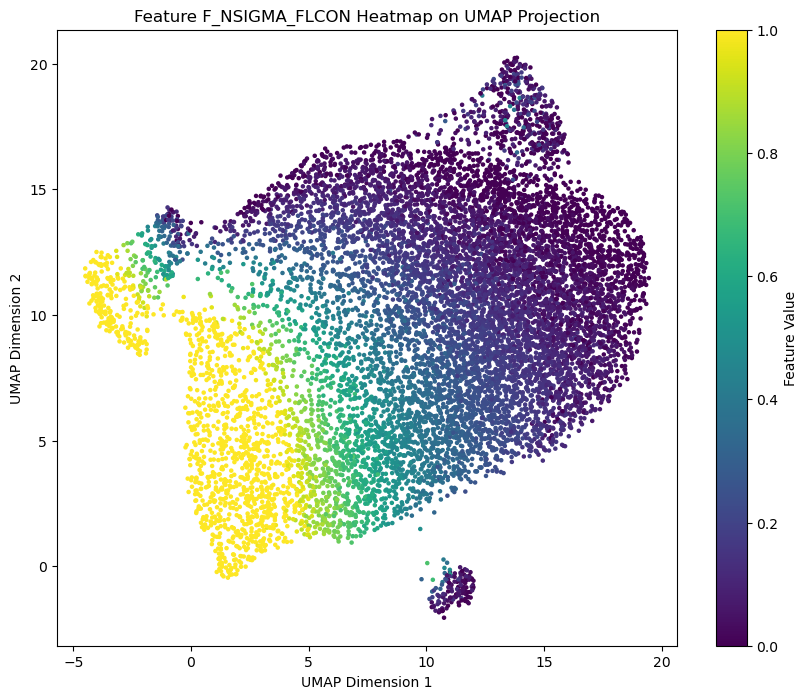

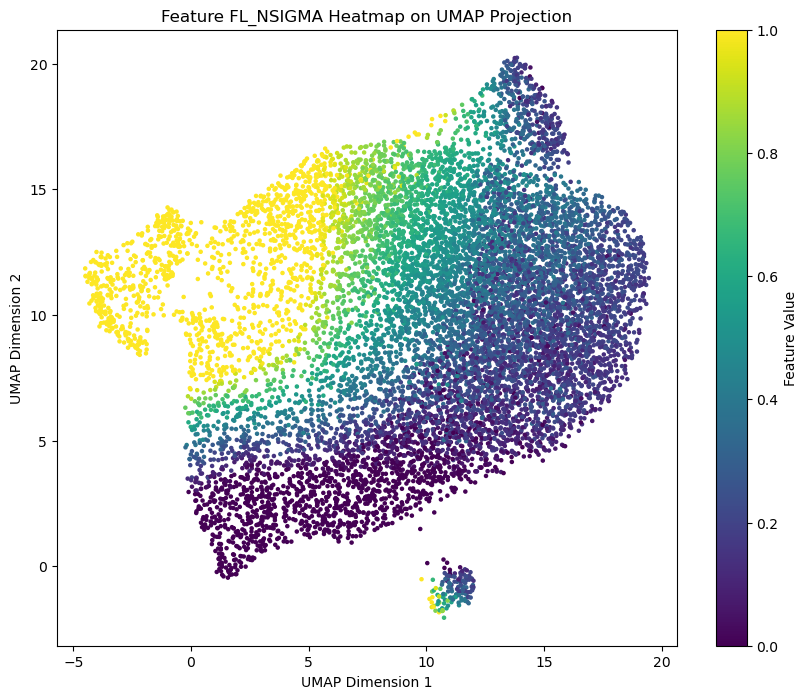

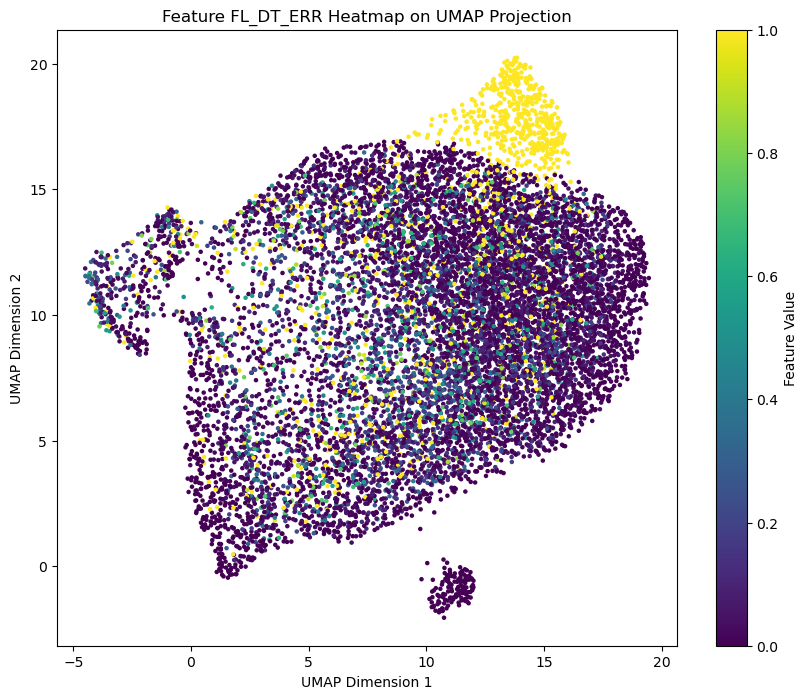

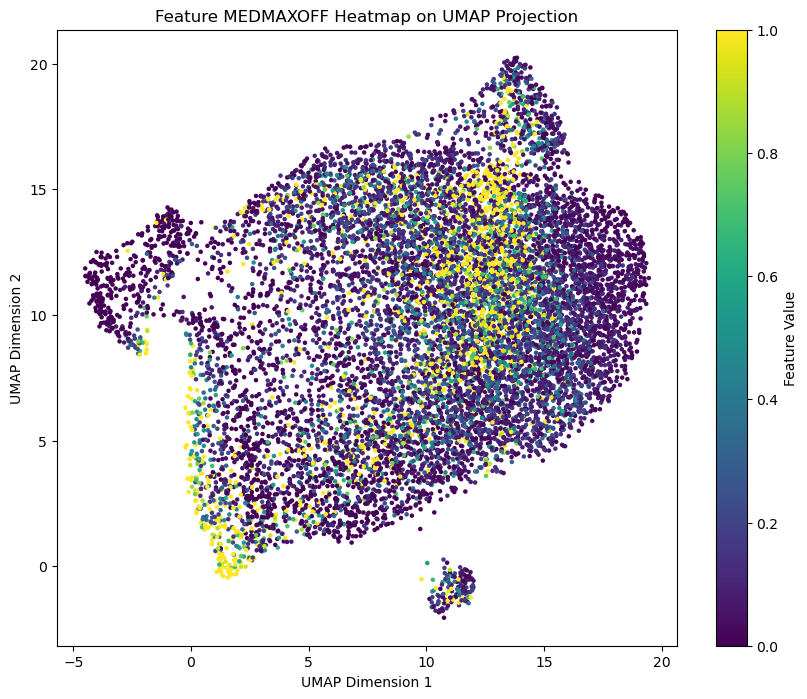

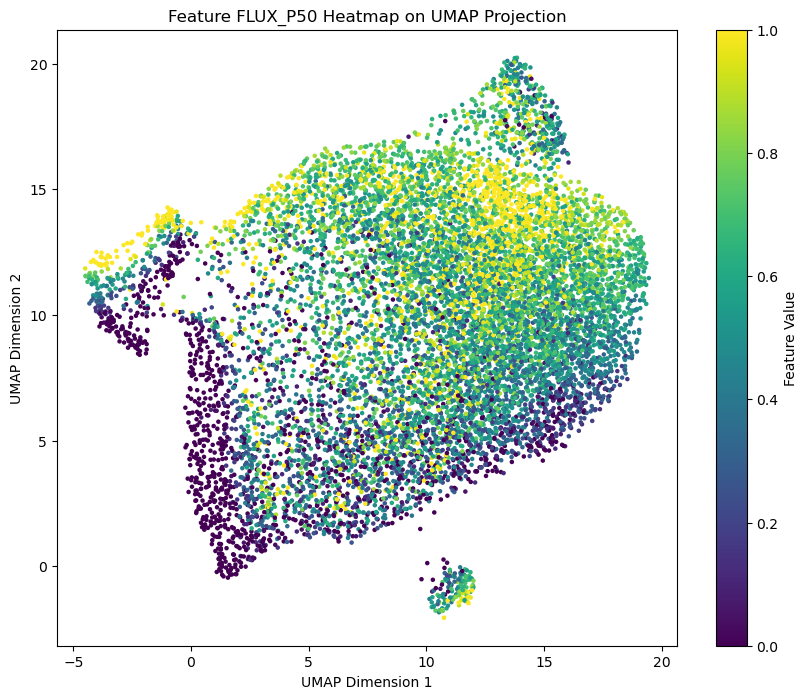

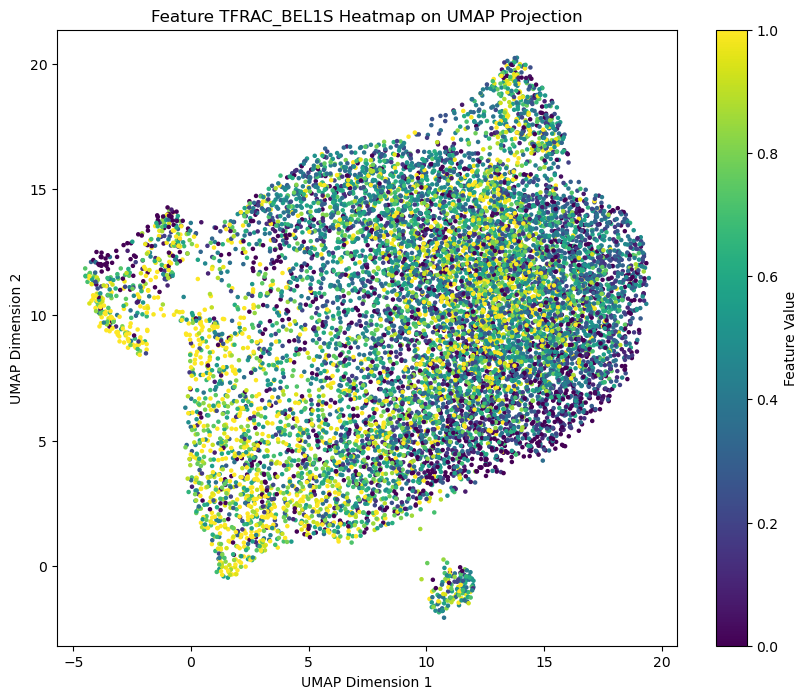

In [91]:
def scale_to_percentile(feature_values, lower_percentile=10, upper_percentile=90):
    # Calculate the specified lower and upper percentiles for the feature
    lower_bound = np.percentile(feature_values, lower_percentile)
    upper_bound = np.percentile(feature_values, upper_percentile)
    
    # Scale feature values to the [lower_bound, upper_bound] range
    scaled_values = np.clip(feature_values, lower_bound, upper_bound)
    
    # Normalize scaled values to [0, 1]
    normalized_values = (scaled_values - lower_bound) / (upper_bound - lower_bound)
    
    return normalized_values


for i in range(X_train[impofi].shape[1]):
    # Example for visualizing the first feature as a heatmap
    feature_index = i  # Change this index to visualize different features
    feature_name = impofi[feature_index]#X_train.columns[feature_index]

    # Normalizing the feature values to [0, 1] for consistent coloring
    normalized_feature_values = scale_to_percentile(X_train[impofi].iloc[:, feature_index].values)
 
    plt.figure(figsize=(10, 8))
    plt.scatter(embedding[:, 0], embedding[:, 1], c=normalized_feature_values, cmap='viridis', s=5)
    plt.colorbar(label='Feature Value')
    plt.title(f'Feature {feature_name} Heatmap on UMAP Projection')
    plt.xlabel('UMAP Dimension 1')
    plt.ylabel('UMAP Dimension 2')
    plt.show()


In [37]:
impofi

['F_NSIGMA_FLCON',
 'FL_NSIGMA',
 'FL_DT_ERR',
 'MEDMAXOFF',
 'FLUX_P50',
 'TFRAC_BEL1S']

In [38]:
import plotly.express as px
import plotly.graph_objects as go


X_train['umap_x'] = embedding[:,0]
X_train['umap_y'] = embedding[:,1]
X_train['ID'] = id_train

X_train['hover_text'] = X_train.apply(lambda row: f'ID: {row.ID}<br>F_NSIGMA_FLCON: {row.F_NSIGMA_FLCON}<br>FL_NSIGMA: {row.FL_NSIGMA}<br>FL_DT_ERR: {row.FL_DT_ERR}<br>MEDMAXOFF: {row.MEDMAXOFF}', axis=1)

fig = go.Figure(data=go.Scatter(
    x=X_train['umap_x'], 
    y=X_train['umap_y'],
    mode='markers',
    text=X_train['hover_text'], # Adjust this to match your feature column name
    hoverinfo='text', # Shows the text on hover
    marker=dict(
        size=5, # Adjust marker size as needed
        color=(X_train['FL_DT_ERR']).argsort().argsort(), # Color points by another feature, if desired
        colorscale='Viridis', # Color scale can be adjusted
        showscale=True
    )
))

fig.update_layout(
    title='Hoover on sources to know who they are',
    xaxis_title='UMAP Dimension 1',
    yaxis_title='UMAP Dimension 2'
    
)

fig.show()


X_train.drop(['umap_x', 'umap_y', 'ID', 'hover_text'], axis = 1, inplace=True)


# Comparison with naïve cutoff on flare model p-value

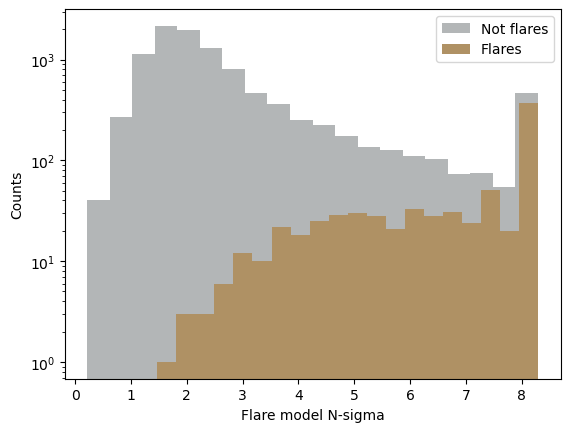

In [39]:
plt.hist((X_train['F_NSIGMA_FLCON'][~y_train]), color = "#B3B6B7", bins = 20, label = "Not flares")
plt.hist((X_train['F_NSIGMA_FLCON'][y_train]), color = "#AF9164", bins = 20, label = "Flares")
plt.xlabel("Flare model N-sigma")
plt.ylabel("Counts")
plt.yscale('log')
plt.legend()
plt.show()

In [40]:
cutoff = 4.4172 #'five sigma cutoff'
fn = ((X_test['F_NSIGMA_FLCON'][y_test]) < cutoff).sum()
tn = ((X_test['F_NSIGMA_FLCON'][~y_test]) < cutoff).sum()
tp = ((X_test['F_NSIGMA_FLCON'][y_test]) >= cutoff).sum()
fp = ((X_test['F_NSIGMA_FLCON'][~y_test]) >= cutoff).sum()

precision_simple_cutoff = tp/(fp+tp)
recall_simple_cutoff = tp/(fn+tp)
f1_simple_cutoff = 2.0/((1/precision_simple_cutoff) + (1/recall_simple_cutoff))
accuracy_simple_cutoff = (tp+tn)/(fp+fn+tp+tn)

print(accuracy_xgb, precision_xgb, recall_xgb, f1_xgb)
print(accuracy_simple_cutoff, precision_simple_cutoff, recall_simple_cutoff, f1_simple_cutoff)
print(accuracy_xgb_nomodel, precision_xgb_nomodel, recall_xgb_nomodel, f1_xgb_nomodel)


0.9707686755683869 0.8235294117647058 0.7329842931937173 0.775623268698061
0.8697221219776254 0.333984375 0.8952879581151832 0.4864864864864865
0.9498376037531577 0.6940298507462687 0.4869109947643979 0.5723076923076924


/var/folders/8w/66mbmptd4ws3j45r5hp0c6w80000gn/T/ipykernel_6695/1291270673.py:7: RuntimeWarning:

invalid value encountered in scalar divide



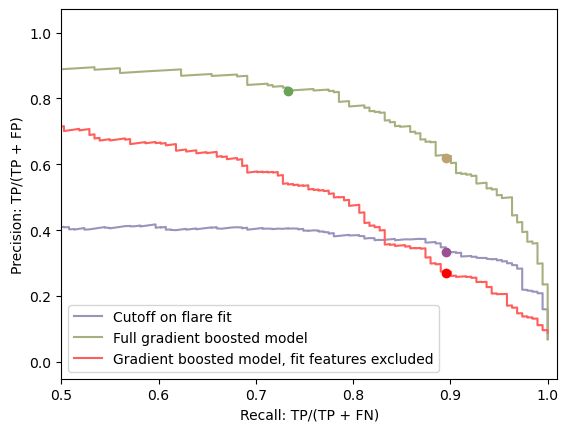

In [41]:
def prec_rec_naive(cutoff):
    fn = ((X_test['F_NSIGMA_FLCON'][y_test]) < cutoff).sum()
    tn = ((X_test['F_NSIGMA_FLCON'][~y_test]) < cutoff).sum()
    tp = ((X_test['F_NSIGMA_FLCON'][y_test]) >= cutoff).sum()
    fp = ((X_test['F_NSIGMA_FLCON'][~y_test]) >= cutoff).sum()

    precision_simple_cutoff = tp/(fp+tp)
    recall_simple_cutoff = tp/(fn+tp)
    #f1_simple_cutoff = 2.0/((1/precision_simple_cutoff) + (1/recall_simple_cutoff))
    #accuracy_simple_cutoff = (tp+tn)/(fp+fn+tp+tn)
    return precision_simple_cutoff, recall_simple_cutoff

a = np.array([prec_rec_naive(c) for c in np.linspace(0, 10, 1000)])
plt.scatter(recall_simple_cutoff, precision_simple_cutoff, color = "#9B5094",zorder=13)
plt.scatter(recall_xgb, precision_xgb, color = "#68A357", zorder=13)
plt.scatter(recall_simple_cutoff, 0.62, color = "#BCA371", zorder=13)
plt.plot(a[:,1], a[:,0], color = "#9A94BC", label = "Cutoff on flare fit")
plt.plot(precision_recall_xgboost[1], precision_recall_xgboost[0], color = "#A6B07E", label = "Full gradient boosted model")
plt.plot(precision_recall_xgboost_nomodel[1], precision_recall_xgboost_nomodel[0]+0.02, color = "#FF5E5B", label = "Gradient boosted model, fit features excluded")
plt.scatter(recall_simple_cutoff, 0.27, color = "#FD0000", zorder=13)
plt.xlim([0.5,1.01])
plt.xlabel("Recall: TP/(TP + FN)")
plt.ylabel("Precision: TP/(TP + FP)")
plt.legend()
plt.show()

The purple curve corresponds to setting a cutoff on F_PROB_FLCON, with the brighter purple dot corresponding to a 5 sigma cutoff. The green curve corresponds to XGBoost, with the brighter green dot corresponding to the cutoff chosen automatically by scikit-learn. The brown dot on the XGBoost curve corresponds to the level of precision that XGBoost would reach at the recall reached by the five-sigma cutoff on F_PROB_FLCON. The corresponding precision is $0.66$ compared to $0.35$ for the five-sigma cutoff on F_PROB_FLCON. This implies that the number of sources I have to vet manually would be about half ($0.35/0.66$) if I used XGBoost instead of the cutoff, as discussed below. This is a fair comparison because the number of flares I would lose (false negatives) would be the same for both classifiers.

#### Additionally, the red curve corresponds to an XGBoost classifier trained without model dependent quantities. At the recall obtained by enforcing a 5-sigma cutoff on F_PROB_FLCON it has a slightly higher precision. At lower recalls it obtains a higher precision (tending towards that of XGBoost with all features) and at higher recall it drops below the simple cutoff strategy in precision.

### What does this mean in terms of manual work saved?

In the following TP will stand for true positives, actual flares correctly tagged as flares; TN will stand for true negatives, actual non-flares correctly tagged as non-flares; FP will stand for false negatives, actual flares tagged as non-flares; and FP will stand for false positives, non-flares tagged as flares.


Out of $N$ sources there are $p N$ actual flares, where $p$ is the actual prevalence of flares.

Given a model with recall $r$, it will correctly tag as flares $r p N$ sources: remember that recall is

\begin{equation}
r = \frac{\mathrm{TP}}{\mathrm{TP} + \mathrm{FN}}
\end{equation}

I will also tag as flares an additional $s (1-p) N$ sources, where $s$ is the false positive rate

\begin{equation}
s = \frac{\mathrm{FP}}{\mathrm{FP} + \mathrm{TN}} = \frac{r p (1/P - 1)}{1-p}
\end{equation}

where $P$ is precision,

\begin{equation}
P = \frac{\mathrm{TP}}{\mathrm{TP} + \mathrm{FP}}
\end{equation}

So in total I will have to look at
\begin{equation}
(r p + s (1-p)) N = \frac{rp}{P} N
\end{equation}
sources out of at total of $N$, to catch $r p N$ actual flares.

I can now compare two models with precision $P$ and $P^\prime > P$ in terms of how many more sources I will have to look at when using the worse model with respect to the better model.

With the model that has precision $P$, to catch $M$ flares I will need to look at $M/P$ sources; with the model that has precision $P^\prime$ I will need to look at $M/P^\prime$ sources.

#### Doubling the precision will halve the number of sources I have to look at to catch the same number of real flares


In [42]:
print("The following is wrong unless you manually changed the values of precision for the cutoff etc.")
p = sum(y_train)/len(y_train)

print("Prevalence: " + str(np.round(p, 2)))

print("Precision (simple cutoff): " + str(np.round(precision_simple_cutoff,2)))

print("Precision (XGBoost without model dependent features): 0.43")
      
print("Precision (XGBoost at the same recall as the simple cutoff): 0.66")

print("To catch 100 flares, without classifier, I have to look at: " + str(100.0/p) + " sources")
print("To catch 100 flares, with cutoff on F_PROB_FLCON, I have to look at: " + str(np.round(100.0/precision_simple_cutoff)) + " sources")
print("To catch 100 flares, with XGBoost without model dependent features, I have to look at: " + str(np.round(100.0/0.43)) + " sources")
print("To catch 100 flares, with XGBoost, I have to look at: " + str(np.round(100.0/0.66)) + " sources")

The following is wrong unless you manually changed the values of precision for the cutoff etc.
Prevalence: 0.07
Precision (simple cutoff): 0.33
Precision (XGBoost without model dependent features): 0.43
Precision (XGBoost at the same recall as the simple cutoff): 0.66
To catch 100 flares, without classifier, I have to look at: 1454.0682414698163 sources
To catch 100 flares, with cutoff on F_PROB_FLCON, I have to look at: 299.0 sources
To catch 100 flares, with XGBoost without model dependent features, I have to look at: 233.0 sources
To catch 100 flares, with XGBoost, I have to look at: 152.0 sources


### Here I visualize the features that are considered important using some pairwise scatter plots 

In [43]:
impofi

['F_NSIGMA_FLCON',
 'FL_NSIGMA',
 'FL_DT_ERR',
 'MEDMAXOFF',
 'FLUX_P50',
 'TFRAC_BEL1S']

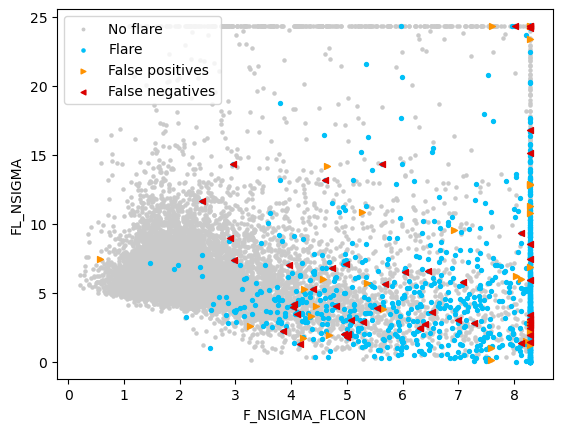

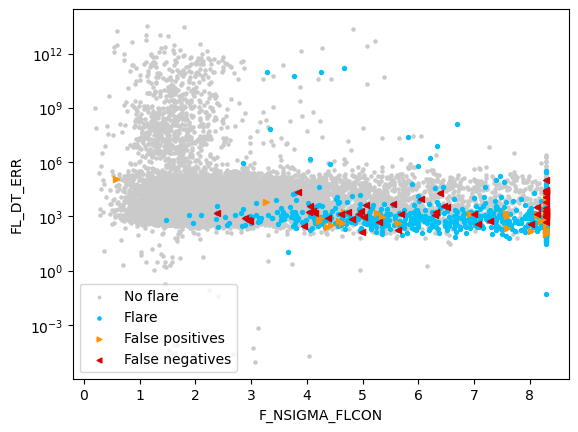

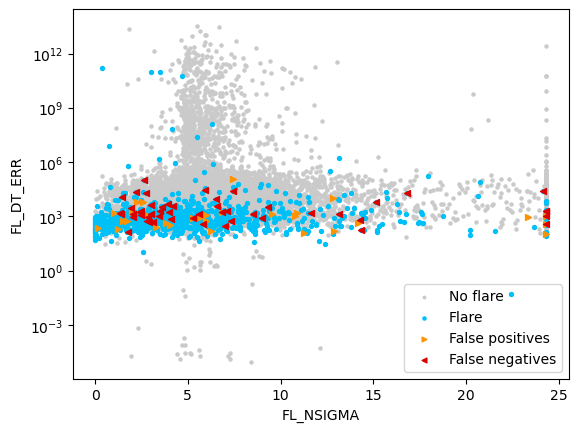

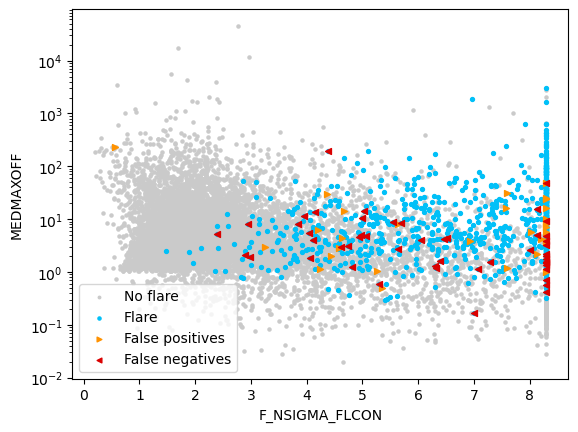

In [44]:
plt.scatter(X_train['F_NSIGMA_FLCON'][~y_train], X_train['FL_NSIGMA'][~y_train], s=5, color = "#CACACA", label = "No flare")
plt.scatter(X_train['F_NSIGMA_FLCON'][y_train], X_train['FL_NSIGMA'][y_train], s=8, color = "#00C0F8", label = "Flare", zorder = 11)
plt.scatter(X_test['F_NSIGMA_FLCON'][~y_test], X_test['FL_NSIGMA'][~y_test], s=5, color = "#CACACA")
plt.scatter(X_test['F_NSIGMA_FLCON'][y_test], X_test['FL_NSIGMA'][y_test],  s=8, color = "#00C0F8", zorder = 12)
plt.scatter(X_test['F_NSIGMA_FLCON'][false_positives], X_test['FL_NSIGMA'][false_positives], s=18, color = "#FF9200", label = "False positives", marker = ">", zorder = 14)
plt.scatter(X_test['F_NSIGMA_FLCON'][false_negatives], X_test['FL_NSIGMA'][false_negatives], s=18, color = "#DA0000", label = "False negatives", marker = "<", zorder = 15)
#plt.xscale('log')
#plt.ylim([-0.5, 28])
plt.xlabel('F_NSIGMA_FLCON')
plt.ylabel('FL_NSIGMA')
plt.legend(markerscale=0.8, loc='upper left')
plt.show()

plt.scatter(X_train['F_NSIGMA_FLCON'][~y_train], X_train['FL_DT_ERR'][~y_train], s=5, color = "#CACACA", label = "No flare")
plt.scatter(X_train['F_NSIGMA_FLCON'][y_train], X_train['FL_DT_ERR'][y_train], s=8, color = "#00C0F8", label = "Flare", zorder = 11)
plt.scatter(X_test['F_NSIGMA_FLCON'][~y_test], X_test['FL_DT_ERR'][~y_test], s=5, color = "#CACACA")
plt.scatter(X_test['F_NSIGMA_FLCON'][y_test], X_test['FL_DT_ERR'][y_test],  s=8, color = "#00C0F8", zorder = 12)
plt.scatter(X_test['F_NSIGMA_FLCON'][false_positives], X_test['FL_DT_ERR'][false_positives], s=18, color = "#FF9200", label = "False positives", marker = ">", zorder = 14)
plt.scatter(X_test['F_NSIGMA_FLCON'][false_negatives], X_test['FL_DT_ERR'][false_negatives], s=18, color = "#DA0000", label = "False negatives", marker = "<", zorder = 15)
#plt.xscale('log')
plt.yscale('log')
#plt.ylim([-0.5, 28])
plt.xlabel('F_NSIGMA_FLCON')
plt.ylabel('FL_DT_ERR')
plt.legend(markerscale=0.8, loc='lower left')
plt.show()

plt.scatter(X_train['FL_NSIGMA'][~y_train], X_train['FL_DT_ERR'][~y_train], s=5, color = "#CACACA", label = "No flare")
plt.scatter(X_train['FL_NSIGMA'][y_train], X_train['FL_DT_ERR'][y_train], s=8, color = "#00C0F8", label = "Flare", zorder = 11)
plt.scatter(X_test['FL_NSIGMA'][~y_test], X_test['FL_DT_ERR'][~y_test], s=5, color = "#CACACA")
plt.scatter(X_test['FL_NSIGMA'][y_test], X_test['FL_DT_ERR'][y_test],  s=8, color = "#00C0F8", zorder = 12)
plt.scatter(X_test['FL_NSIGMA'][false_positives], X_test['FL_DT_ERR'][false_positives], s=18, color = "#FF9200", label = "False positives", marker = ">", zorder = 14)
plt.scatter(X_test['FL_NSIGMA'][false_negatives], X_test['FL_DT_ERR'][false_negatives], s=18, color = "#DA0000", label = "False negatives", marker = "<", zorder = 15)
plt.yscale('log')
#plt.ylim([-0.5, 28])
plt.xlabel('FL_NSIGMA')
plt.ylabel('FL_DT_ERR')
plt.legend(markerscale=0.8, loc='lower right')
plt.show()

plt.scatter(X_train['F_NSIGMA_FLCON'][~y_train], X_train['MEDMAXOFF'][~y_train], s=5, color = "#CACACA", label = "No flare")
plt.scatter(X_train['F_NSIGMA_FLCON'][y_train], X_train['MEDMAXOFF'][y_train], s=8, color = "#00C0F8", label = "Flare", zorder = 11)
plt.scatter(X_test['F_NSIGMA_FLCON'][~y_test], X_test['MEDMAXOFF'][~y_test], s=5, color = "#CACACA")
plt.scatter(X_test['F_NSIGMA_FLCON'][y_test], X_test['MEDMAXOFF'][y_test],  s=8, color = "#00C0F8", zorder = 12)
plt.scatter(X_test['F_NSIGMA_FLCON'][false_positives], X_test['MEDMAXOFF'][false_positives], s=18, color = "#FF9200", label = "False positives", marker = ">", zorder = 14)
plt.scatter(X_test['F_NSIGMA_FLCON'][false_negatives], X_test['MEDMAXOFF'][false_negatives], s=18, color = "#DA0000", label = "False negatives", marker = "<", zorder = 15)
#plt.xscale('log')
plt.yscale('log')
#plt.ylim([-0.5, 28])
plt.xlabel('F_NSIGMA_FLCON')
plt.ylabel('MEDMAXOFF')
plt.legend(markerscale=0.8, loc='lower left')
plt.show()



In [53]:
impofi

['F_NSIGMA_FLCON',
 'FL_NSIGMA',
 'FL_DT_ERR',
 'MEDMAXOFF',
 'FLUX_P50',
 'TFRAC_BEL1S']

### Here I plot individual conditional expectation curves for the most important features

In [87]:
from numpy import convolve

# Choose the feature to vary
def plot_ice(i, q = [0.1, 0.9], n = 60, s = 37, w = 20, l = False):
    
    window_size = w  # This can be adjusted based on how smooth you want the curve to be
    window = np.ones(int(window_size))/float(window_size)
    
    feature_name = impofi[i]  # Assuming you want to plot for the first feature in impofi
    feature_index = X_train.columns.get_loc(feature_name)

    # Generate a range of values for the selected feature
    x_range = np.linspace(start = min(X_train[feature_name]), stop = max(X_train[feature_name]), num = len(X_train[feature_name])) #X_train[feature_name].sort_values().values
    if l:
        x_range = np.logspace(start = np.log(min((X_train[feature_name])[X_train[feature_name]>0])), stop = np.log(max(X_train[feature_name])), num = len(X_train[feature_name]))

    
    # Initialize a figure for plotting
    plt.figure(figsize=(10, 8))

    # Select a small number of instances to plot ICE curves for clarity
    num_instances = n  # Adjust based on your dataset size
    np.random.seed(s)
    instance_indices = np.random.choice(X_train.shape[0], size=num_instances, replace=False)

    for i in instance_indices:
        # Copy the dataset to not modify the original X_train
        X_temp = X_train.copy()
        # Set the feature column to the range of values
        X_temp[feature_name] = x_range
        # Ensure only the values for other features are taken from the ith instance
        for col in X_temp.columns:
            if col != feature_name:
                X_temp[col] = X_train.iloc[i][col]
        # Predict using the modified dataset
        y_pred = model_xgb.predict_proba(X_temp)[:,1]
        y_pred_smoothed = convolve(y_pred, window, mode='same')
        # Plot the ICE curve for this instance
        if y_train.iloc[i]:
            plt.plot(x_range, y_pred_smoothed, color='#00C0F8', alpha=0.5, zorder=13)
        else:
            plt.plot(x_range, y_pred_smoothed, color='#CACACA', alpha=0.5, zorder=4)        

    # Enhance plot
    #plt.title(f'ICE Plot for {feature_name}')
    plt.xlabel(feature_name)
    plt.ylabel('Confidence in classification as flare')
    xlims = [X_train[feature_name].quantile(q[0]), X_train[feature_name].quantile(q[1])]
    #print(xlims)
    if l:
        plt.xscale('log')
        if xlims[0] <= 0:
            xlims[0] = min((X_train[feature_name])[(X_train[feature_name])>0])
    #print(xlims)
    plt.xlim(xlims)
    
    for t, y in zip(X_train[feature_name], y_train):
        if(y):
            plt.axvline(t, ymin=0.01, ymax=0.02, color='#00C0F8', linewidth=0.1)
        else:
            plt.axvline(t, ymin=0.02, ymax=0.03, color='#CACACA', linewidth=0.1)            
    plt.show()

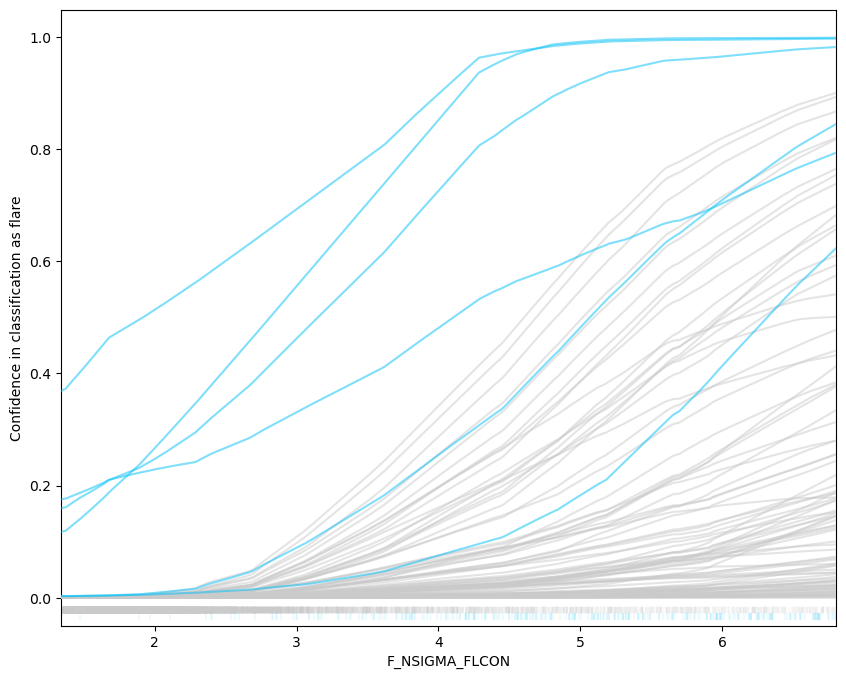

In [94]:
plot_ice(0, n = 100, l=False, q=[0.1, 0.9], w=4000)

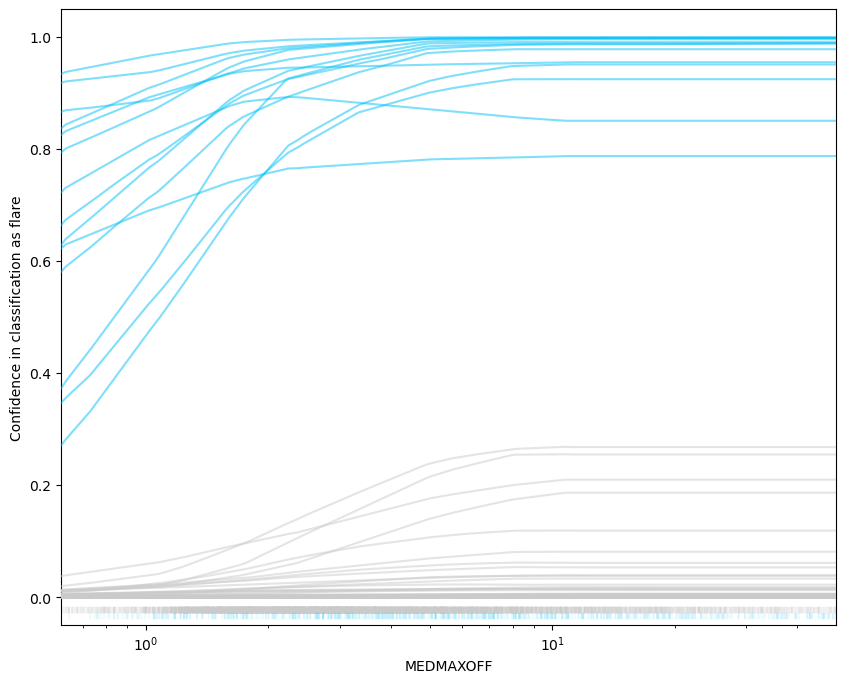

In [109]:
plot_ice(3, n = 200, q=[0.05, 0.95], w = 500, l=True)

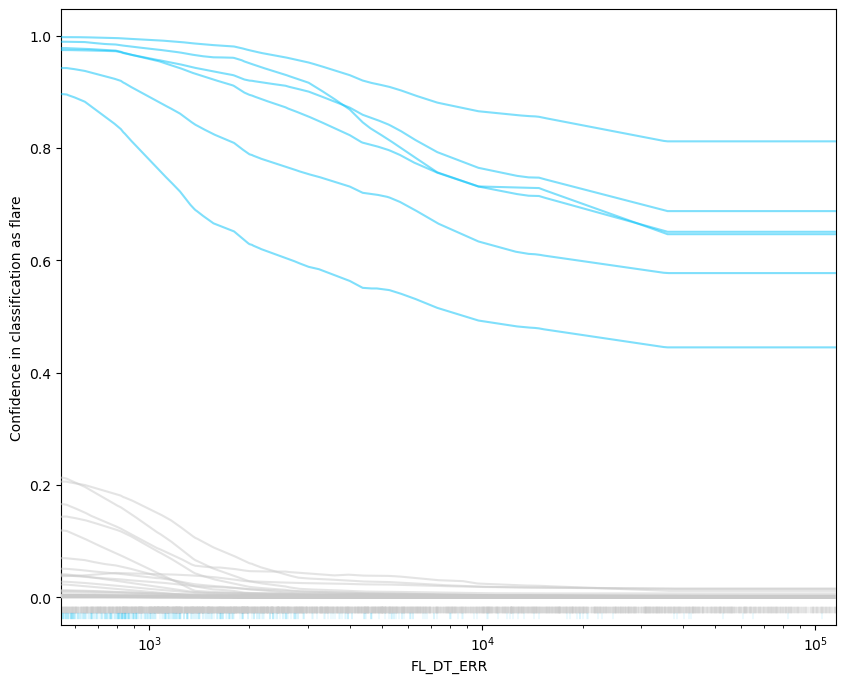

In [106]:
plot_ice(2, n=100, q=[0.1, 0.9], l = True, w = 100) #maybe we should go back to using the actual points rather than logspace...

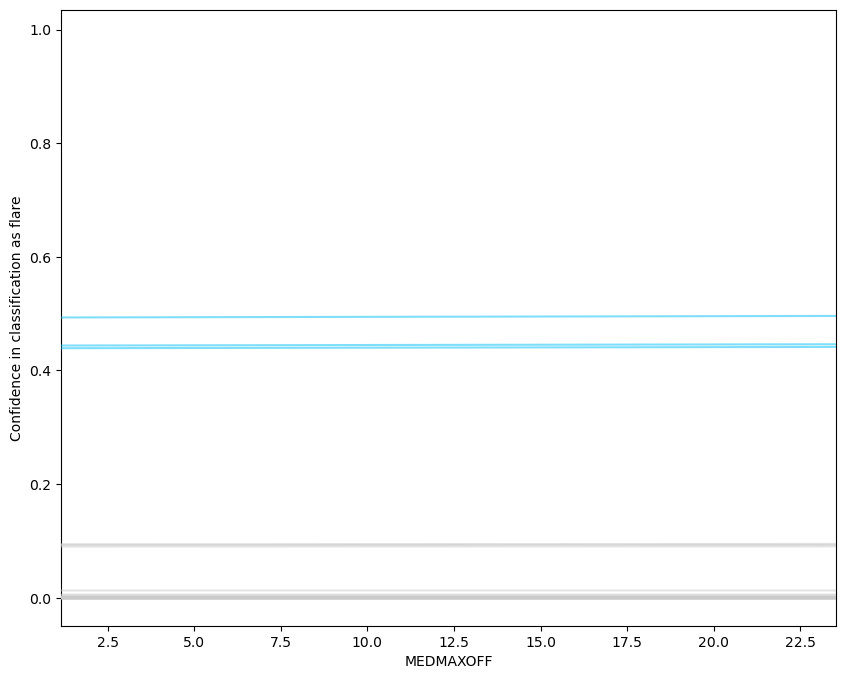

In [49]:
plot_ice(3, w= 37)

In [50]:
min(X_train["FL_DT_ERR"])

0.0

### Plotting galactic latitude 
Histogram or cum of galactic latitude of flares versus all sources

In [51]:
tra = pd.read_csv("translate_coords.csv")


### Old plots

In [52]:
# Choose the feature to vary
feature_name = impofi[1]  # Assuming you want to plot for the first feature in impofi
feature_index = X_train.columns.get_loc(feature_name)

# Generate a range of values for the selected feature
x_range = X_train[feature_name].sort_values().values

# Initialize a figure for plotting
plt.figure(figsize=(10, 8))

# Select a small number of instances to plot ICE curves for clarity
num_instances = 100  # Adjust based on your dataset size
instance_indices = np.random.choice(X_train.shape[0], size=num_instances, replace=False)

for i in instance_indices:
    # Copy the dataset to not modify the original X_train
    X_temp = X_train.copy()
    # Set the feature column to the range of values
    X_temp[feature_name] = x_range
    # Ensure only the values for other features are taken from the ith instance
    for col in X_temp.columns:
        if col != feature_name:
            X_temp[col] = X_train.iloc[i][col]
    # Predict using the modified dataset
    y_pred = model_xgb.predict_proba(X_temp)[:,1]
    y_pred_smoothed = convolve(y_pred, window, mode='same')
    # Plot the ICE curve for this instance
    if y_train.iloc[i]:
        plt.plot(x_range, y_pred_smoothed, color='#00C0F8')
    else:
        plt.plot(x_range, y_pred_smoothed, color='#CACACA')        

# Enhance plot
#plt.title(f'ICE Plot for {feature_name}')
plt.xlabel(feature_name)
plt.ylabel('Confidence in classification as flare')
#plt.xscale('log')
plt.xlim(X_train[feature_name].quantile([0.01, 0.99]))
plt.show()

NameError: name 'window' is not defined

<Figure size 1000x800 with 0 Axes>

In [ ]:
# Choose the feature to vary
feature_name = impofi[2]  # Assuming you want to plot for the first feature in impofi
feature_index = X_train.columns.get_loc(feature_name)

# Generate a range of values for the selected feature
x_range = X_train[feature_name].sort_values().values

# Initialize a figure for plotting
plt.figure(figsize=(10, 8))

# Select a small number of instances to plot ICE curves for clarity
num_instances = 100  # Adjust based on your dataset size
instance_indices = np.random.choice(X_train.shape[0], size=num_instances, replace=False)

for i in instance_indices:
    # Copy the dataset to not modify the original X_train
    X_temp = X_train.copy()
    # Set the feature column to the range of values
    X_temp[feature_name] = x_range
    # Ensure only the values for other features are taken from the ith instance
    for col in X_temp.columns:
        if col != feature_name:
            X_temp[col] = X_train.iloc[i][col]
    # Predict using the modified dataset
    y_pred = model_xgb.predict_proba(X_temp)[:,1]
    y_pred_smoothed = convolve(y_pred, window, mode='same')
    # Plot the ICE curve for this instance
    if y_train.iloc[i]:
        plt.plot(x_range, y_pred_smoothed, color='#00C0F8')
    else:
        plt.plot(x_range, y_pred_smoothed, color='#CACACA')        

# Enhance plot
#plt.title(f'ICE Plot for {feature_name}')
plt.xlabel(feature_name)
plt.ylabel('Confidence in classification as flare')
plt.xscale('log')
plt.xlim(X_train[feature_name].quantile([0.01, 0.99]))
plt.show()

In [ ]:
# Choose the feature to vary
feature_name = impofi[3]  # Assuming you want to plot for the first feature in impofi
feature_index = X_train.columns.get_loc(feature_name)

# Generate a range of values for the selected feature
x_range = X_train[feature_name].sort_values().values

# Initialize a figure for plotting
plt.figure(figsize=(10, 8))

# Select a small number of instances to plot ICE curves for clarity
num_instances = 100  # Adjust based on your dataset size
instance_indices = np.random.choice(X_train.shape[0], size=num_instances, replace=False)

for i in instance_indices:
    # Copy the dataset to not modify the original X_train
    X_temp = X_train.copy()
    # Set the feature column to the range of values
    X_temp[feature_name] = x_range
    # Ensure only the values for other features are taken from the ith instance
    for col in X_temp.columns:
        if col != feature_name:
            X_temp[col] = X_train.iloc[i][col]
    # Predict using the modified dataset
    y_pred = model_xgb.predict_proba(X_temp)[:,1]
    y_pred_smoothed = convolve(y_pred, window, mode='same')
    # Plot the ICE curve for this instance
    if y_train.iloc[i]:
        plt.plot(x_range, y_pred_smoothed, color='#00C0F8')
    else:
        plt.plot(x_range, y_pred_smoothed, color='#CACACA')        

# Enhance plot
#plt.title(f'ICE Plot for {feature_name}')
plt.xlabel(feature_name)
plt.ylabel('Confidence in classification as flare')
plt.xscale('log')
plt.xlim(X_train[feature_name].quantile([0.01, 0.99]))
plt.show()

In [ ]:
# Choose the feature to vary
feature_name = impofi[4]  # Assuming you want to plot for the first feature in impofi
feature_index = X_train.columns.get_loc(feature_name)

# Generate a range of values for the selected feature
x_range = X_train[feature_name].sort_values().values

# Initialize a figure for plotting
plt.figure(figsize=(10, 8))

# Select a small number of instances to plot ICE curves for clarity
num_instances = 100  # Adjust based on your dataset size
instance_indices = np.random.choice(X_train.shape[0], size=num_instances, replace=False)

for i in instance_indices:
    # Copy the dataset to not modify the original X_train
    X_temp = X_train.copy()
    # Set the feature column to the range of values
    X_temp[feature_name] = x_range
    # Ensure only the values for other features are taken from the ith instance
    for col in X_temp.columns:
        if col != feature_name:
            X_temp[col] = X_train.iloc[i][col]
    # Predict using the modified dataset
    y_pred = model_xgb.predict_proba(X_temp)[:,1]
    y_pred_smoothed = convolve(y_pred, window, mode='same')
    # Plot the ICE curve for this instance
    if y_train.iloc[i]:
        plt.plot(x_range, y_pred_smoothed, color='#00C0F8')
    else:
        plt.plot(x_range, y_pred_smoothed, color='#CACACA')        

# Enhance plot
#plt.title(f'ICE Plot for {feature_name}')
plt.xlabel(feature_name)
plt.ylabel('Confidence in classification as flare')
plt.xscale('log')
plt.xlim(X_train[feature_name].quantile([0.01, 0.99]))
plt.show()



In [ ]:
# Choose the feature to vary
feature_name = impofi[6]  # Assuming you want to plot for the first feature in impofi
feature_index = X_train.columns.get_loc(feature_name)

# Generate a range of values for the selected feature
x_range = X_train[feature_name].sort_values().values

# Initialize a figure for plotting
plt.figure(figsize=(10, 8))

# Select a small number of instances to plot ICE curves for clarity
num_instances = 100  # Adjust based on your dataset size
instance_indices = np.random.choice(X_train.shape[0], size=num_instances, replace=False)

for i in instance_indices:
    # Copy the dataset to not modify the original X_train
    X_temp = X_train.copy()
    # Set the feature column to the range of values
    X_temp[feature_name] = x_range
    # Ensure only the values for other features are taken from the ith instance
    for col in X_temp.columns:
        if col != feature_name:
            X_temp[col] = X_train.iloc[i][col]
    # Predict using the modified dataset
    y_pred = model_xgb.predict_proba(X_temp)[:,1]
    y_pred_smoothed = convolve(y_pred, window, mode='same')
    # Plot the ICE curve for this instance
    if y_train.iloc[i]:
        plt.plot(x_range, y_pred_smoothed, color='#00C0F8')
    else:
        plt.plot(x_range, y_pred_smoothed, color='#CACACA')        

# Enhance plot
#plt.title(f'ICE Plot for {feature_name}')
plt.xlabel(feature_name)
plt.ylabel('Confidence in classification as flare')
plt.xscale('log')
plt.xlim(X_train[feature_name].quantile([0.01, 0.99]))
plt.show()

# Predicting on the new data

```python import numpy as np import matplotlib.pyplot as plt # Generate sample data data1 = np.random.normal(0, 1, 1000) data2 = np.random.normal(1, 1.5, 1000) # Define the bins bins = np.linspace(-5, 5, 30) # Compute histograms hist1, bin_edges1 = np.histogram(data1, bins=bins, density=True) hist2, bin_edges2 = np.histogram(data2, bins=bins, density=True) # Normalize the histograms hist1 = hist1 / hist1.sum() hist2 = hist2 / hist2.sum() # Plot the histograms plt.step(bin_edges1[:-1], hist1, where='mid', label='Data 1', color='blue', lw=2) plt.step(bin_edges2[:-1], hist2, where='mid', label='Data 2', color='orange', lw=2) # Add labels and legend plt.xlabel('Value') plt.ylabel('Normalized Frequency') plt.title('Normalized Histograms') plt.legend() plt.show() ```

In [ ]:
martino = pd.read_csv("apex_2000-2020_binsize499_connsigmaM5.csv")

In [ ]:
martino.head()

In [ ]:
martino['RESCALED_MEDIAN'] = (martino['MEDIAN'] - martino['FLUX_0'])/(martino['FLUX_1'] - martino['FLUX_0'])

X_martino = martino[good_variables]

ID = (martino['EXTRAS_ID'])

filter_m1000 = ~(X_martino == -1000).any(axis=1)
X_martino_filtered = X_martino[filter_m1000]
ID_martino_filtered = ID[filter_m1000]

print(X_martino.shape)
print(X_martino_filtered.shape)


In [ ]:
preds_xgb_martino = model_xgb.predict(X_martino_filtered)
preds_proba_xgb_martino = model_xgb.predict_proba(X_martino_filtered)[:,1]

In [ ]:
tra = pd.read_csv("translate_coords.csv")
preds_df = pd.DataFrame({"EXTRAS_ID":ID_martino_filtered, "preds_xgb_martino":preds_xgb_martino})

merged_df = pd.merge(tra, preds_df, on='EXTRAS_ID', how='inner') 
print(merged_df)

In [ ]:
np.sum(preds_xgb_martino)

In [ ]:
(82.4*np.sum(preds_xgb_martino))/100

In [ ]:
from astropy.coordinates import SkyCoord
import astropy.units as u # Define RA and Dec
ra = merged_df["PPS_RA"] * u.degree
dec = merged_df["PPS_DEC"] * u.degree 
coord = SkyCoord(ra=ra, dec=dec, frame='icrs')
galactic_coord = coord.galactic 
plt.hist(galactic_coord.b, bins=32)
plt.hist(galactic_coord.b[merged_df["preds_xgb_martino"]==1.0], bins=32)
plt.show()

In [ ]:
nbinf = 9 #int(np.sqrt(np.sum(merged_df["preds_xgb_martino"]))/2.0)
nbinall = nbinf #int(np.sqrt(len(galactic_coord.b.value)))
bins1 = np.linspace(0, 90, nbinall)
bins2 = np.linspace(0, 90, nbinf)
# Compute histograms 
hist1, bin_edges1 = np.histogram(np.abs(galactic_coord.b.value), bins=bins1, density=True)
hist2, bin_edges2 = np.histogram(np.abs(galactic_coord.b[merged_df["preds_xgb_martino"]==1.0].value), bins=bins2, density=True)
# Normalize the histograms
hist1 = hist1 / hist1.sum()
hist2 = hist2 / hist2.sum()
# Plot the histograms
plt.step(bin_edges1[:-1], hist1, where='mid', label='All sources', color='#CACACA', lw=2)
plt.step(bin_edges2[:-1], hist2, where='mid', label='Predicted flares', color='#00C0F8', lw=2)
# Add labels and legend 
plt.xlabel('|b| (degrees)')
plt.ylabel('Normalized Frequency')
plt.legend()
plt.show()

In [ ]:
from scipy.stats import ks_2samp 
statistic, p_value = ks_2samp(np.abs(galactic_coord.b[merged_df["preds_xgb_martino"]==0.0].value), np.abs(galactic_coord.b[merged_df["preds_xgb_martino"]==1.0].value)) 
print(f"KS Statistic: {statistic}")
print(f"P-value: {p_value}")

In [ ]:
plt.hist(preds_proba_xgb_martino)
plt.show()

In [ ]:
pd.DataFrame({"ID":ID_martino_filtered, "preds_proba":preds_proba_xgb_martino}).sort_values(by="preds_proba", ascending=False).to_csv("results.csv", index=False)

In [ ]:
martino.columns

In [ ]:
plt.scatter((martino["TSTART_LC"])[filter_m1000], preds_proba_xgb_martino, s = 2)
plt.yscale('log')
plt.show()
binnum = 10
bindown = (martino["TSTART_LC"])[filter_m1000].quantile(np.arange(binnum)/binnum)
binup = (martino["TSTART_LC"])[filter_m1000].quantile((np.arange(binnum)+1)/binnum)

def pp_inbin(up, down):
    pp = preds_proba_xgb_martino[((martino["TSTART_LC"])[filter_m1000] < up) & ((martino["TSTART_LC"])[filter_m1000] > down)]
    return np.sum(pp > 0.5)/len(pp)

def pp_inbin_err(up, down):
    pp = preds_proba_xgb_martino[((martino["TSTART_LC"])[filter_m1000] < up) & ((martino["TSTART_LC"])[filter_m1000] > down)]
    return np.sqrt(np.sum(pp > 0.5))/len(pp)
    

fra = [(pp_inbin(np.array(binup)[i], np.array(bindown)[i])) for i in range(len(binup))]
fraerr = [(pp_inbin_err(np.array(binup)[i], np.array(bindown)[i])) for i in range(len(binup))]

plt.plot(1998.0+ (binup/(365.25*24*3600)), fra)
plt.plot(1998.0+ (binup/(365.25*24*3600)), np.array(fra) + np.array(fraerr))
plt.plot(1998.0+ (binup/(365.25*24*3600)), np.array(fra) - np.array(fraerr))

plt.show()

def plotthis(f):
    plt.scatter(1998.0 + (martino["TSTART_LC"])[filter_m1000]/(365.25*24*3600), (martino[f])[filter_m1000], s=3)
    plt.ylabel(f)
    plt.yscale("log")
    plt.show()

impofi = ["FL_NSIGMA", "FL_DT_ERR", "MEDMAXOFF", "FLUX_P50", "TFRAC_BEL1S"]    
    
for f in impofi:
    plotthis(f)
    

#aggiungi colonna che dice se sono nel training sample o no MANDA A TUTTI E SOPRATTUTO A RUBEN

In [ ]:
martino

In [ ]:
#quando il modello xgboost becca un flare che il fit a flare fallisce, perché? quali feature usa?

In [ ]:
#quando escludi le feature del fit a flare, quali sono le feature che usa il modello senza variabili di fit a flare?

In [ ]:
#guarda quelli misclassificati dal fit a flaree ben classificati da xgboost con/senza modello

In [ ]:
#guarda le ice curves per i parametri che non ineriscono al fit a flare per quei flare che sono misclassificati dal fit a flare ma ben classificati da xgboost 

In [ ]:
#sottolinea che le lineette blu e grive che nn si intersecano implicano no interactions

In [ ]:
#spiega il plot dell'antagonismo (shapley) e spiega una o due curvette blu (ice)

In [ ]:
X_filtered

In [ ]:
np.sum(y_filtered)

In [ ]:
np.sum(data_raw['MULTIFL']=="Y")